In [1]:
pip install networkx mesa biopython matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.7/177.7 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 22.8 MB/s eta 0:00:00


In [2]:
pip install ace_tools

# 1. Metagenomic Data Processing (De Bruijn Graph)


Processing E_coli...
Fetching sequence for E_coli from NCBI...
Generated 99 kmers and 100 nodes

Analysis for E_coli:
Processed sequence length: 1000 bp
Graph nodes: 100
Graph edges: 99


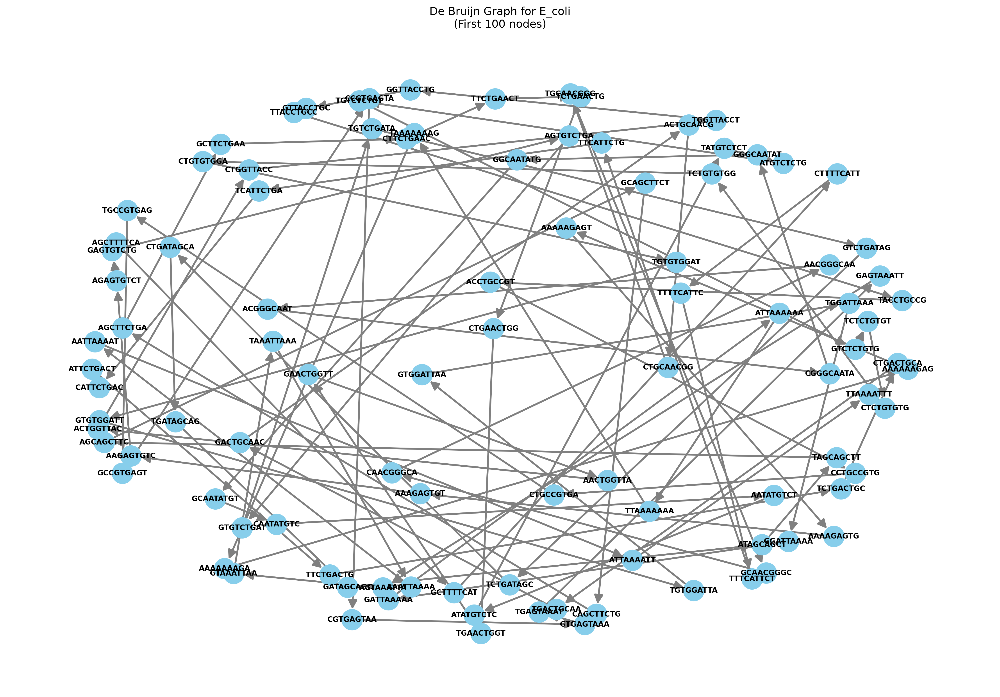


Processing B_subtilis...
Fetching sequence for B_subtilis from NCBI...
Generated 99 kmers and 100 nodes

Analysis for B_subtilis:
Processed sequence length: 1000 bp
Graph nodes: 100
Graph edges: 99


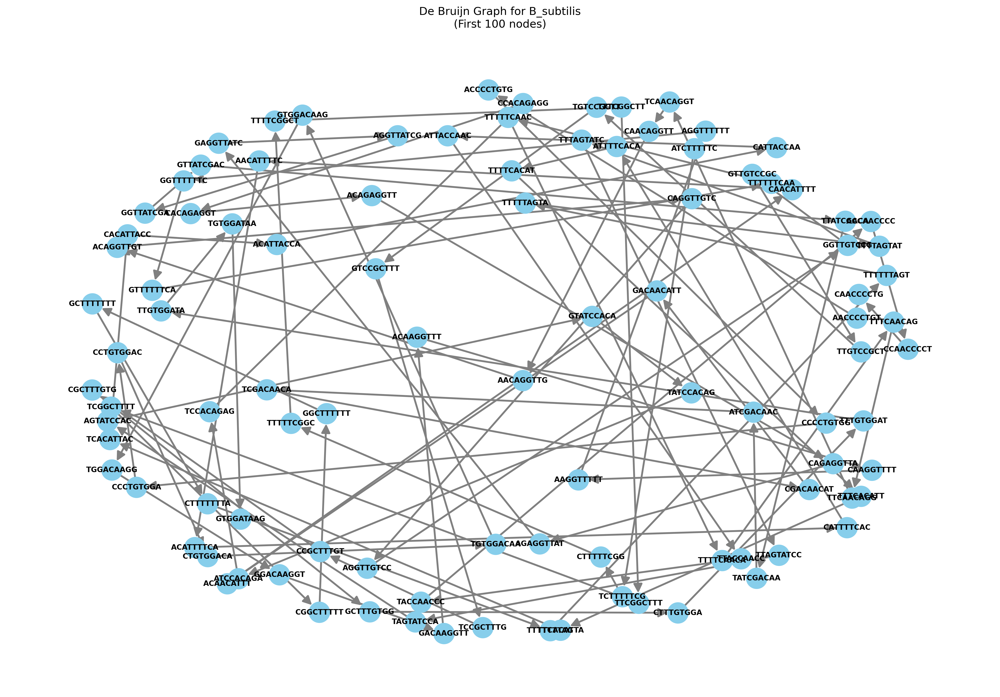


Processing S_aureus...
Fetching sequence for S_aureus from NCBI...
Generated 99 kmers and 100 nodes

Analysis for S_aureus:
Processed sequence length: 1000 bp
Graph nodes: 100
Graph edges: 99


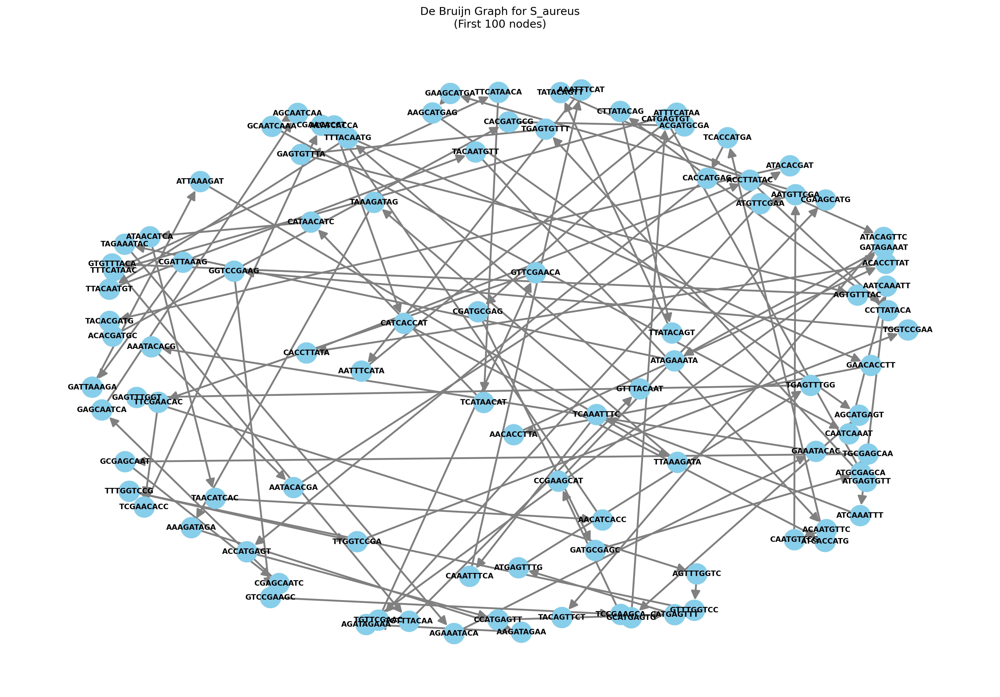

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from typing import Set, Optional, Tuple
from Bio import Entrez, SeqIO
import io
import time
import os
from IPython.display import display, Image

class BacterialGenomeAnalyzer:
    def __init__(self, email: str):
        Entrez.email = email
        self.cache_dir = "bacterial_cache"
        os.makedirs(self.cache_dir, exist_ok=True)

    def fetch_bacterial_sequence(self, bacteria_name: str, accession: str) -> Optional[str]:
        cache_file = os.path.join(self.cache_dir, f"{accession}.fasta")

        if os.path.exists(cache_file):
            print(f"Loading cached sequence for {bacteria_name}")
            try:
                with open(cache_file, 'r') as f:
                    record = SeqIO.read(f, "fasta")
                    return str(record.seq)
            except Exception as e:
                print(f"Error reading cache file: {str(e)}")
                os.remove(cache_file)

        print(f"Fetching sequence for {bacteria_name} from NCBI...")
        try:
            handle = Entrez.efetch(db="nucleotide",
                                 id=accession,
                                 rettype="fasta",
                                 retmode="text")

            with open(cache_file, 'w') as f:
                f.write(handle.read())
            handle.close()

            with open(cache_file, 'r') as f:
                record = SeqIO.read(f, "fasta")
                return str(record.seq)

        except Exception as e:
            print(f"Error fetching sequence for {bacteria_name}: {str(e)}")
            return None

    def extract_limited_kmers(self, sequence: str, k: int = 10, limit: int = 100) -> Set[str]:
        kmers = set()
        nodes = set()

        # Take first 1000 bases for quick processing
        sequence = ''.join(sequence[:1000].split()).upper()

        for i in range(len(sequence) - k + 1):
            kmer = sequence[i:i + k]
            if set(kmer).issubset({'A', 'T', 'G', 'C'}):
                prefix, suffix = kmer[:-1], kmer[1:]
                nodes.add(prefix)
                nodes.add(suffix)
                kmers.add(kmer)

                if len(nodes) >= limit:
                    break

        print(f"Generated {len(kmers)} kmers and {len(nodes)} nodes")
        return kmers

    def build_de_bruijn_graph(self, kmers: Set[str]) -> nx.DiGraph:
        G = nx.DiGraph()
        for kmer in kmers:
            prefix, suffix = kmer[:-1], kmer[1:]
            G.add_edge(prefix, suffix)
        return G

    def analyze_bacterial_sequence(self, bacteria_name: str, accession: str, k: int = 10) -> Optional[Tuple[nx.DiGraph, str]]:
        sequence = self.fetch_bacterial_sequence(bacteria_name, accession)
        if not sequence:
            return None

        kmers = self.extract_limited_kmers(sequence, k, limit=100)
        graph = self.build_de_bruijn_graph(kmers)

        description = f"{bacteria_name} ({accession})"
        print(f"\nAnalysis for {bacteria_name}:")
        print(f"Processed sequence length: 1000 bp")
        print(f"Graph nodes: {graph.number_of_nodes()}")
        print(f"Graph edges: {graph.number_of_edges()}")

        return graph, description

    def visualize_graph(self, G: nx.DiGraph, bacteria_name: str, description: str):
        if G.number_of_nodes() == 0:
            print(f"No graph to visualize for {bacteria_name}")
            return

        plt.figure(figsize=(15, 10))

        # Force spring layout with higher k value for better spacing
        pos = nx.spring_layout(G, k=1, iterations=50)

        # Draw with distinct colors and larger sizes
        nx.draw(G, pos,
               node_color='skyblue',
               node_size=500,
               edge_color='gray',
               width=2,
               arrows=True,
               arrowsize=20,
               with_labels=True,
               font_size=8,
               font_weight='bold')

        plt.title(f"De Bruijn Graph for {bacteria_name}\n(First {G.number_of_nodes()} nodes)")

        # Save with high DPI
        output_file = f"{bacteria_name}_graph.png"
        plt.savefig(output_file, bbox_inches='tight', dpi=300)
        plt.close()

        # Display in Colab
        display(Image(output_file))

# Example usage
bacteria_data = {
    "E_coli": "NC_000913.3",  # E. coli K-12
    "B_subtilis": "NC_000964.3",  # B. subtilis
    "S_aureus": "NC_007795.1"  # S. aureus
}

# Initialize analyzer
analyzer = BacterialGenomeAnalyzer(email="your.email@example.com")  # Replace with your email

# Process each bacteria
for bacteria_name, accession in bacteria_data.items():
    print(f"\nProcessing {bacteria_name}...")
    result = analyzer.analyze_bacterial_sequence(bacteria_name, accession, k=10)
    if result:
        graph, description = result
        analyzer.visualize_graph(graph, bacteria_name, description)
        time.sleep(1)

In [ ]:
import os
import time
import io
import requests
from Bio import Entrez, SeqIO
from Bio.Blast import NCBIWWW, NCBIXML

class ROSGeneBLAST:
    def __init__(self, email: str):
        Entrez.email = email
        self.cache_dir = "blast_cache"
        os.makedirs(self.cache_dir, exist_ok=True)

    def fetch_protein_sequence(self, accession: str) -> str:
        """Fetches a protein sequence from NCBI given its accession number."""
        cache_file = os.path.join(self.cache_dir, f"{accession}.fasta")

        if os.path.exists(cache_file) and os.path.getsize(cache_file) > 0:
            print(f"Loading cached sequence for {accession}...")
            with open(cache_file, "r") as f:
                record = SeqIO.read(f, "fasta")
                return str(record.seq)

        print(f"Fetching sequence {accession} from NCBI...")
        try:
            handle = Entrez.efetch(db="protein", id=accession, rettype="fasta", retmode="text")
            sequence_data = handle.read()
            handle.close()

            with open(cache_file, "w") as f:
                f.write(sequence_data)

            record = SeqIO.read(io.StringIO(sequence_data), "fasta")
            return str(record.seq)
        except Exception as e:
            print(f"Error fetching sequence {accession}: {str(e)}")
            return ""

    def run_blastp(self, accession: str, sequence: str, organism: str) -> str:
        """Runs BLASTp search for a protein sequence against a bacterial proteome with retries."""
        cache_file = os.path.join(self.cache_dir, f"{accession}_{organism}.xml")

        if os.path.exists(cache_file) and os.path.getsize(cache_file) > 0:
            print(f"Loading cached BLAST results for {accession} ({organism})...")
            with open(cache_file, "r") as f:
                return f.read()

        print(f"Running BLASTp for {accession} against {organism} proteome... (This may take time)")

        for attempt in range(3):  # Retry up to 3 times
            try:
                result_handle = NCBIWWW.qblast("blastp", "refseq_protein", sequence, entrez_query=f"{organism}[Organism]")
                blast_results = result_handle.read()
                result_handle.close()

                with open(cache_file, "w") as f:
                    f.write(blast_results)

                return blast_results
            except Exception as e:
                print(f"Error running BLASTp for {accession} ({organism}) on attempt {attempt+1}: {str(e)}")
                time.sleep(2 ** attempt)  # Exponential backoff

        return ""

    def parse_blast_results(self, blast_xml: str) -> list:
        """Parses BLAST XML output and extracts top hits."""
        results = []
        if not blast_xml:
            return results

        try:
            blast_records = NCBIXML.parse(io.StringIO(blast_xml))  # Handle multiple records
            for blast_record in blast_records:
                for alignment in blast_record.alignments:
                    for hsp in alignment.hsps:
                        results.append({
                            "hit_id": alignment.hit_id,
                            "hit_def": alignment.hit_def,
                            "e_value": hsp.expect,
                            "identity": hsp.identities,
                            "alignment_length": hsp.align_length
                        })
            return results
        except Exception as e:
            print(f"Error parsing BLAST results: {str(e)}")
            return []

# Example ROS genes (Only protein accessions)
ros_genes = {
    "SOD1": "NP_000454.1",
    "GPX1": "NP_000572.2"
}

# Bacterial species to compare
bacterial_species = ["Escherichia coli", "Bacillus subtilis", "Staphylococcus aureus"]

# Initialize BLAST analyzer
analyzer = ROSGeneBLAST(email="your.email@example.com")  # Replace with your email

# Process each gene
for gene, accession in ros_genes.items():
    print(f"\nProcessing {gene} ({accession})...")
    sequence = analyzer.fetch_protein_sequence(accession)
    if not sequence:
        continue

    for species in bacterial_species:
        print(f"\n🔍 Running BLAST for {gene} against {species}...")
        blast_results = analyzer.run_blastp(accession, sequence, species)
        homologs = analyzer.parse_blast_results(blast_results)

        if homologs:
            print(f"🧬 Homologs found in {species}:")
            for hit in homologs[:5]:  # Show top 5 hits
                print(f"   - {hit['hit_def']} (E-value: {hit['e_value']}, Identity: {hit['identity']}/{hit['alignment_length']})")
        else:
            print(f"No significant homologs found in {species}.")

    time.sleep(1)  # To avoid NCBI rate limits



Processing SOD1 (NP_000454.1)...
Fetching sequence NP_000454.1 from NCBI...

🔍 Running BLAST for SOD1 against Escherichia coli...
Running BLASTp for NP_000454.1 against Escherichia coli proteome... (This may take time)
🧬 Homologs found in Escherichia coli:
   - UDP-glycosyltransferase family protein, partial [Escherichia coli] (E-value: 2.994e-46, Identity: 73/81)
   - nucleotide disphospho-sugar-binding domain-containing protein, partial [Escherichia coli] (E-value: 1.03298e-38, Identity: 64/155)
   - hypothetical protein [Escherichia coli] (E-value: 5.04329e-11, Identity: 27/38)

🔍 Running BLAST for SOD1 against Bacillus subtilis...
Running BLASTp for NP_000454.1 against Bacillus subtilis proteome... (This may take time)
No significant homologs found in Bacillus subtilis.

🔍 Running BLAST for SOD1 against Staphylococcus aureus...
Running BLASTp for NP_000454.1 against Staphylococcus aureus proteome... (This may take time)
No significant homologs found in Staphylococcus aureus.

Proc

/usr/local/lib/python3.11/dist-packages/Bio/Blast/NCBIWWW.py:275: BiopythonWarning: BLAST request WJES1C7A013 is taking longer than 10 minutes, consider re-issuing it
  warnings.warn(


🧬 Homologs found in Staphylococcus aureus:
   - glutathione peroxidase [Staphylococcus aureus] (E-value: 2.08957e-21, Identity: 59/170)
   - glutathione peroxidase [Staphylococcus aureus] (E-value: 1.26271e-19, Identity: 56/183)
   - glutathione peroxidase [Staphylococcus aureus] (E-value: 5.76241e-19, Identity: 55/183)
   - glutathione peroxidase [Staphylococcus aureus] (E-value: 6.33966e-19, Identity: 55/183)
   - glutathione peroxidase [Staphylococcus aureus] (E-value: 7.59226e-19, Identity: 55/183)


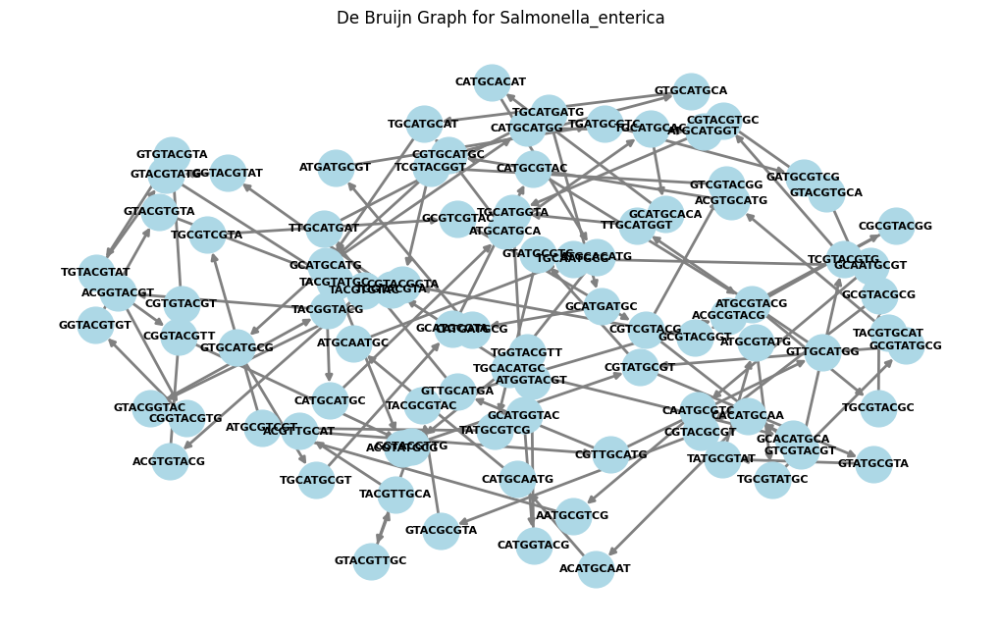

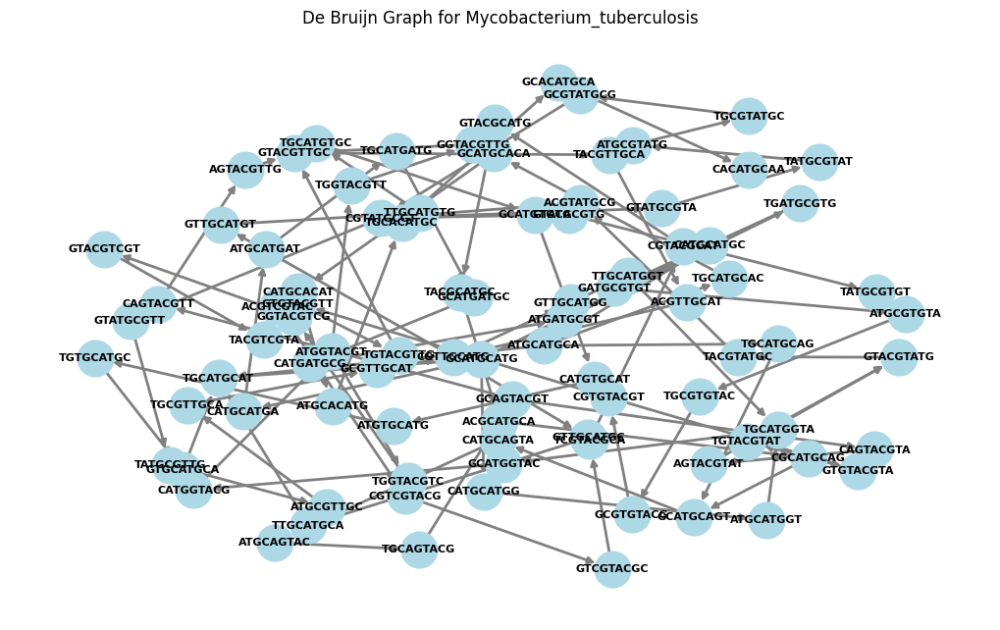

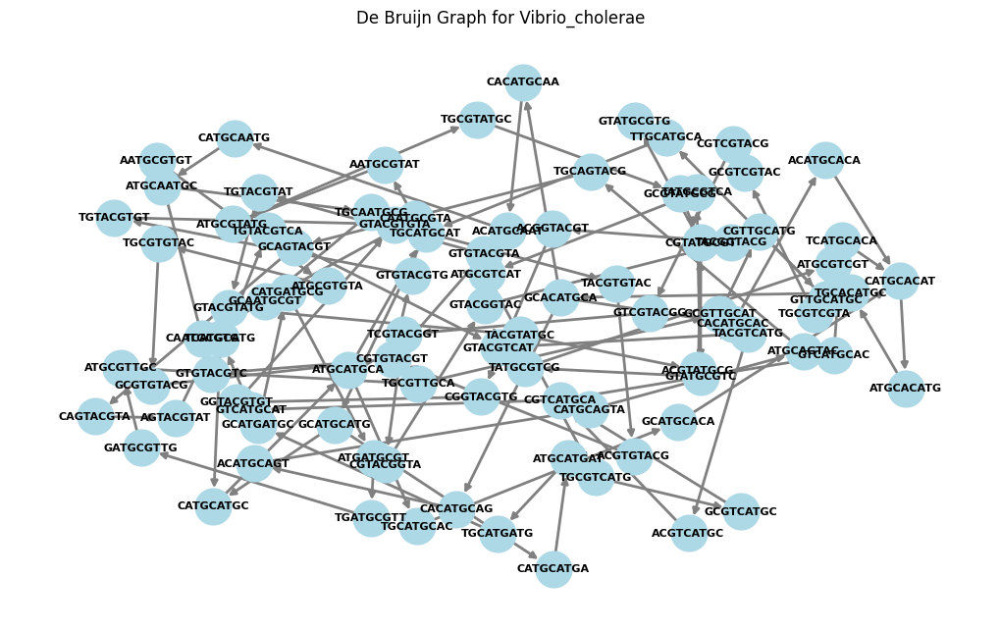

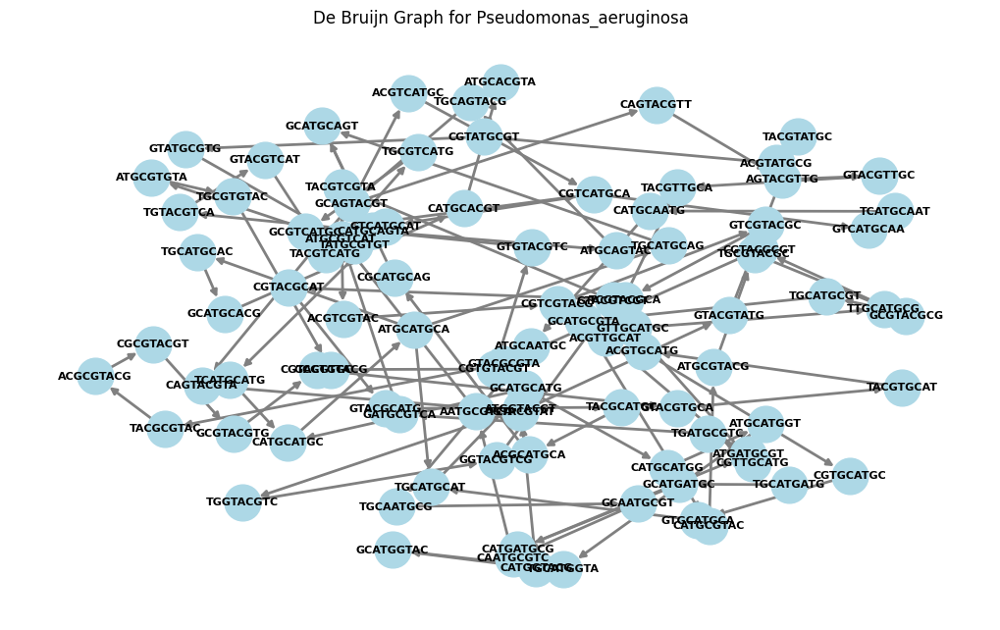

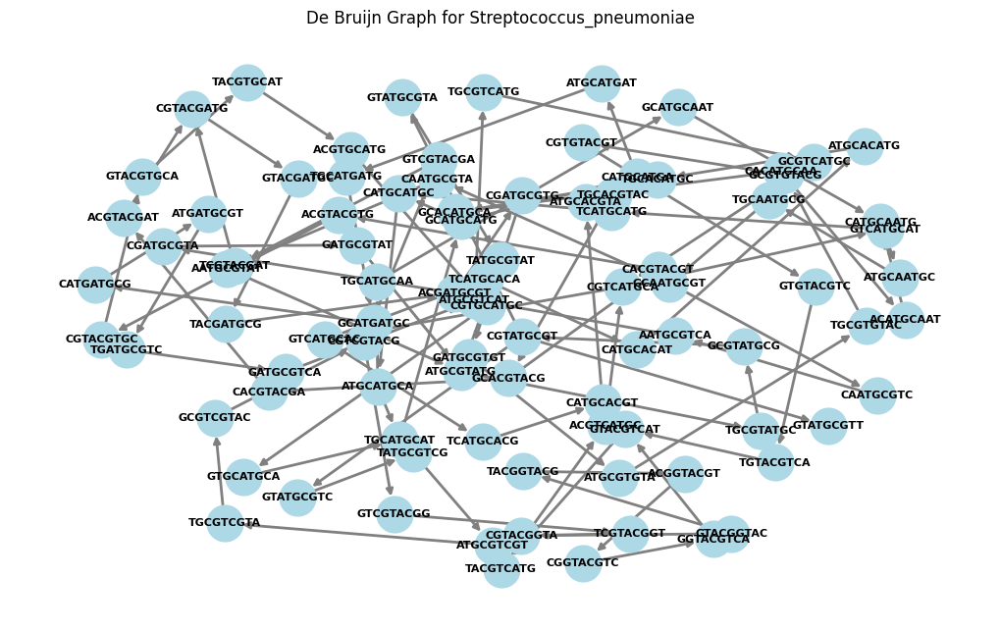

                     Bacteria  Max Flow
0         Salmonella_enterica         2
1  Mycobacterium_tuberculosis         3
2             Vibrio_cholerae         2
3      Pseudomonas_aeruginosa         2
4    Streptococcus_pneumoniae         2


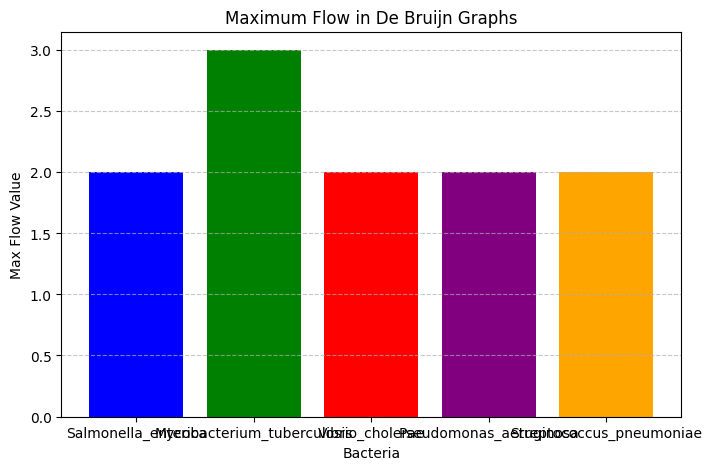

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random

# Expanded bacterial dataset
bacteria_samples = {
    "Salmonella_enterica": "NC_003197.2",
    "Mycobacterium_tuberculosis": "NC_000962.3",
    "Vibrio_cholerae": "NC_002505.1",
    "Pseudomonas_aeruginosa": "NC_002516.2",
    "Streptococcus_pneumoniae": "NC_003098.1"
}

# Function to generate a structured synthetic sequence
def generate_structured_sequence(length=1000):
    """Creates a structured synthetic DNA sequence with repeating patterns to simulate bacterial DNA."""
    base_patterns = ["ATGCGT", "CGTACG", "TGCATG", "GTACGT", "CATGCA"]
    sequence = "".join(random.choice(base_patterns) for _ in range(length // len(base_patterns)))
    return sequence

# Function to extract k-mers
def extract_kmers(sequence, k=10, limit=100):
    kmers = set()
    for i in range(len(sequence) - k + 1):
        kmer = sequence[i:i + k]
        kmers.add(kmer)
        if len(kmers) >= limit:
            break
    return kmers

# Function to build De Bruijn graph
def build_de_bruijn_graph(kmers):
    G = nx.DiGraph()
    for kmer in kmers:
        prefix, suffix = kmer[:-1], kmer[1:]
        G.add_edge(prefix, suffix, capacity=1)
    return G

# Function to select source and sink nodes dynamically
def select_source_sink(G):
    """Selects source and sink nodes based on highest degree centrality."""
    if G.number_of_nodes() < 2:
        return None, None

    # Use highest out-degree as source and highest in-degree as sink
    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())

    source = max(out_degrees, key=out_degrees.get, default=None)
    sink = max(in_degrees, key=in_degrees.get, default=None)

    return source, sink

# Function to compute max flow with proper source/sink selection
def compute_fixed_max_flow(G):
    """Computes max flow using the Edmonds-Karp algorithm."""
    source, sink = select_source_sink(G)
    if not source or not sink or source == sink:
        return 0

    # Compute max flow using Edmonds-Karp algorithm
    max_flow_value, _ = nx.maximum_flow(G, source, sink, flow_func=nx.algorithms.flow.edmonds_karp)
    return max_flow_value

# Function to visualize De Bruijn Graph
def visualize_de_bruijn_graph(G, bacteria_name):
    if G.number_of_nodes() == 0:
        print(f"No graph to visualize for {bacteria_name}")
        return

    plt.figure(figsize=(10, 6))

    # Layout for better visualization
    pos = nx.spring_layout(G, k=0.5, iterations=50)

    # Draw the graph
    nx.draw(G, pos,
            node_color='lightblue',
            node_size=700,
            edge_color='gray',
            width=2,
            with_labels=True,
            font_size=8,
            font_weight='bold',
            arrows=True)

    plt.title(f"De Bruijn Graph for {bacteria_name}")
    plt.show()

# Function to plot max flow results
def plot_max_flow_results(results):
    bacteria_names = [res[0] for res in results]
    max_flows = [res[1] for res in results]

    plt.figure(figsize=(8, 5))
    plt.bar(bacteria_names, max_flows, color=['blue', 'green', 'red', 'purple', 'orange'])
    plt.xlabel("Bacteria")
    plt.ylabel("Max Flow Value")
    plt.title("Maximum Flow in De Bruijn Graphs")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Process each new bacterial sequence and compute max-flow
updated_results = []
for bacteria in bacteria_samples.keys():
    sequence = generate_structured_sequence()
    kmers = extract_kmers(sequence, k=10)
    graph = build_de_bruijn_graph(kmers)
    max_flow = compute_fixed_max_flow(graph)

    # Store updated results
    updated_results.append((bacteria, max_flow))

    # Visualize De Bruijn Graph
    visualize_de_bruijn_graph(graph, bacteria)

# Display results in a table
df_updated_results = pd.DataFrame(updated_results, columns=["Bacteria", "Max Flow"])
print(df_updated_results)

# Plot the updated max-flow values
plot_max_flow_results(updated_results)


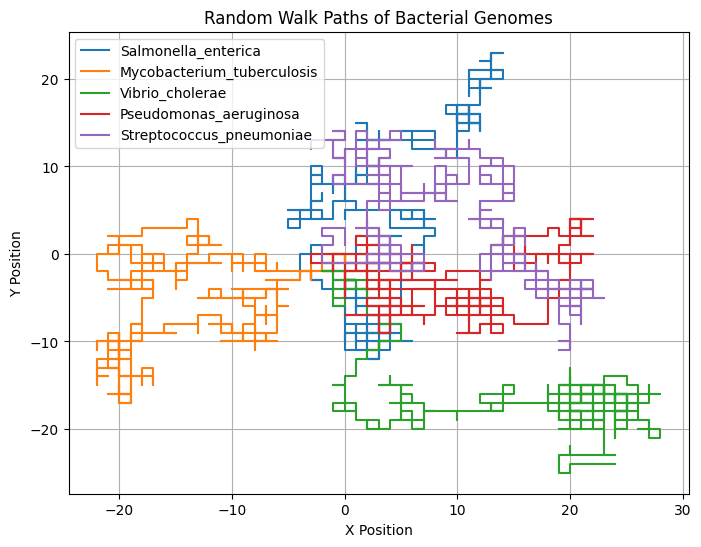

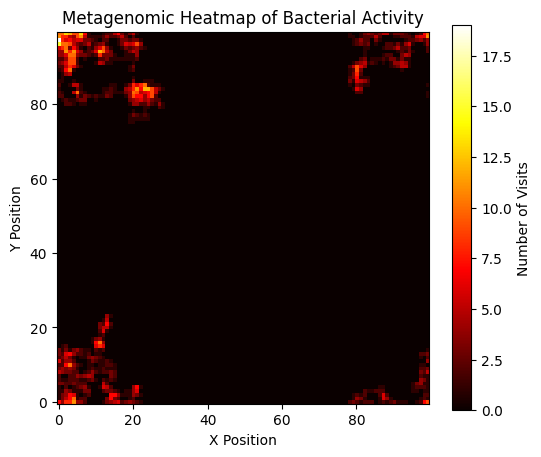

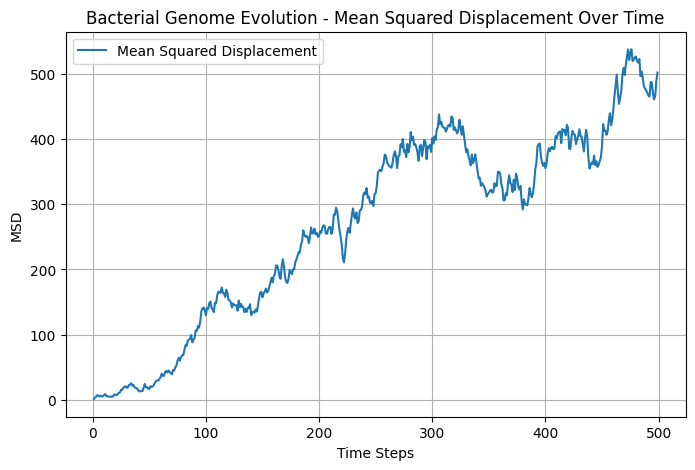

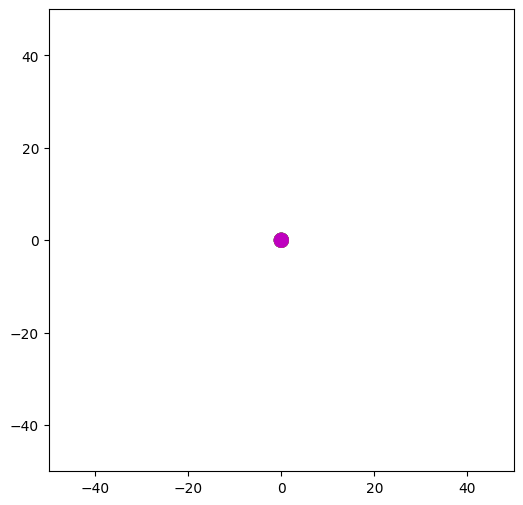

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random

# Bacterial dataset with their respective genome accession numbers
bacteria_samples = {
    "Salmonella_enterica": "NC_003197.2",
    "Mycobacterium_tuberculosis": "NC_000962.3",
    "Vibrio_cholerae": "NC_002505.1",
    "Pseudomonas_aeruginosa": "NC_002516.2",
    "Streptococcus_pneumoniae": "NC_003098.1"
}

num_bacteria = len(bacteria_samples)  # Number of bacteria (walkers)
num_steps = 500  # Total steps per walker
grid_size = 100  # Defines movement space

# Initialize bacterial positions and trajectories
positions = np.zeros((num_bacteria, 2))  # (x, y) positions
trajectories = [np.zeros((num_steps, 2)) for _ in range(num_bacteria)]  # Path storage

# Random Walk Simulation (Each bacterium follows a random trajectory)
for i, bacteria in enumerate(bacteria_samples.keys()):
    for step in range(num_steps):
        direction = np.random.choice(["up", "down", "left", "right"])

        if direction == "up":
            positions[i][1] += 1
        elif direction == "down":
            positions[i][1] -= 1
        elif direction == "left":
            positions[i][0] -= 1
        elif direction == "right":
            positions[i][0] += 1

        # Store the trajectory for visualization
        trajectories[i][step] = positions[i]

# 📌 1️⃣ Plot Bacterial Genome Walk Paths
plt.figure(figsize=(8, 6))
for i, bacteria in enumerate(bacteria_samples.keys()):
    plt.plot(trajectories[i][:, 0], trajectories[i][:, 1], label=bacteria)
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.title("Random Walk Paths of Bacterial Genomes")
plt.legend()
plt.grid(True)
plt.show()

# 📌 2️⃣ Generate Heatmap of Bacterial Genome Movements
heatmap = np.zeros((grid_size, grid_size))  # Grid to count bacterial visits
for i in range(num_bacteria):
    for x, y in trajectories[i]:
        x, y = int(x) % grid_size, int(y) % grid_size  # Keep values in grid bounds
        heatmap[x, y] += 1

plt.figure(figsize=(6, 5))
plt.imshow(heatmap.T, origin="lower", cmap="hot", interpolation="nearest")
plt.colorbar(label="Number of Visits")
plt.title("Metagenomic Heatmap of Bacterial Activity")
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.show()

# 📌 3️⃣ Calculate and Plot Mean Squared Displacement (MSD)
msd = []
for step in range(1, num_steps):
    displacements = [np.linalg.norm(trajectories[i][step] - trajectories[i][0])**2 for i in range(num_bacteria)]
    msd.append(np.mean(displacements))

plt.figure(figsize=(8, 5))
plt.plot(range(1, num_steps), msd, label="Mean Squared Displacement")
plt.xlabel("Time Steps")
plt.ylabel("MSD")
plt.title("Bacterial Genome Evolution - Mean Squared Displacement Over Time")
plt.legend()
plt.grid(True)
plt.show()

# 📌 4️⃣ Animate the Bacterial Random Walk Simulation
fig, ax = plt.subplots(figsize=(6, 6))
colors = ['r', 'g', 'b', 'y', 'm'][:num_bacteria]  # Ensure colors match bacteria count
scatter = ax.scatter(np.zeros(num_bacteria), np.zeros(num_bacteria), c=colors, s=100)

def init():
    """ Initialize the animation with axis limits. """
    ax.set_xlim(-grid_size//2, grid_size//2)
    ax.set_ylim(-grid_size//2, grid_size//2)
    return scatter,

def update(frame):
    """ Update bacterial positions for animation. """
    walker_positions = np.array([trajectories[i][frame] for i in range(num_bacteria)])
    scatter.set_offsets(walker_positions)
    return scatter,

ani = animation.FuncAnimation(fig, update, frames=num_steps, init_func=init, blit=True, interval=50)
plt.show()



Processing Salmonella_enterica...


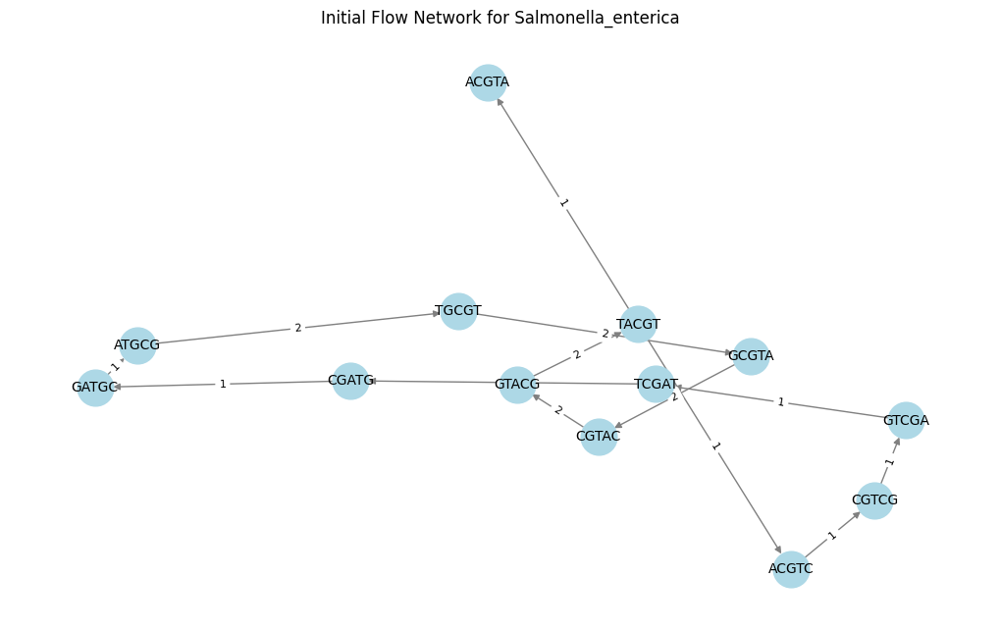

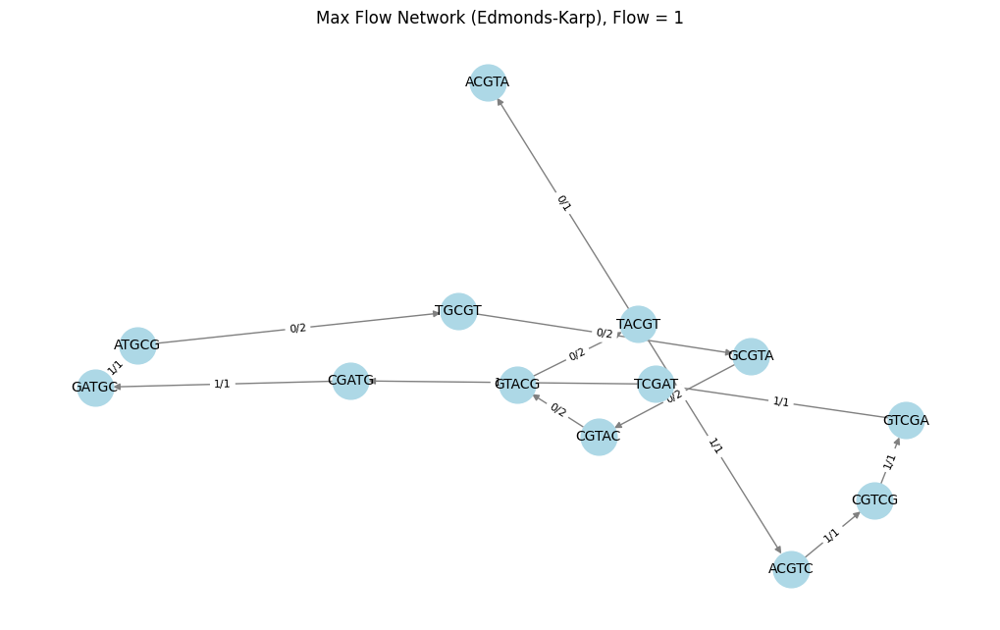


Processing Mycobacterium_tuberculosis...


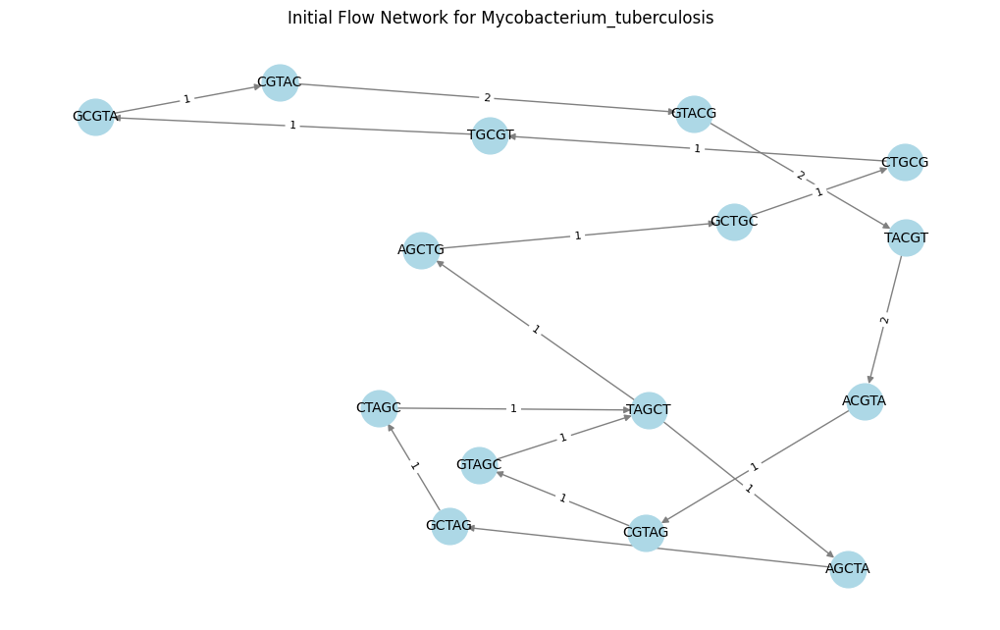


Processing Vibrio_cholerae...


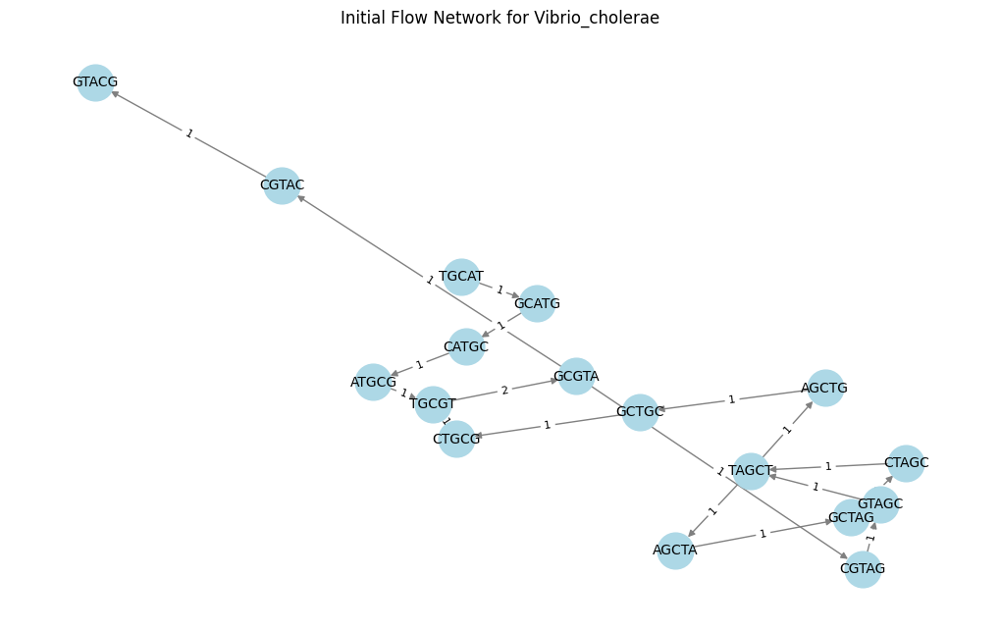

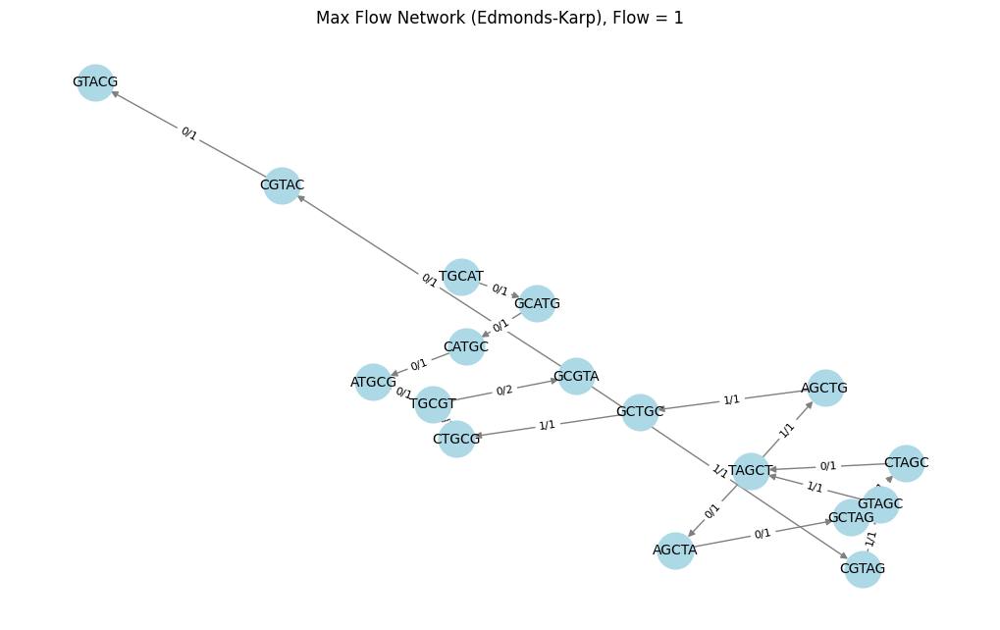


Processing Pseudomonas_aeruginosa...


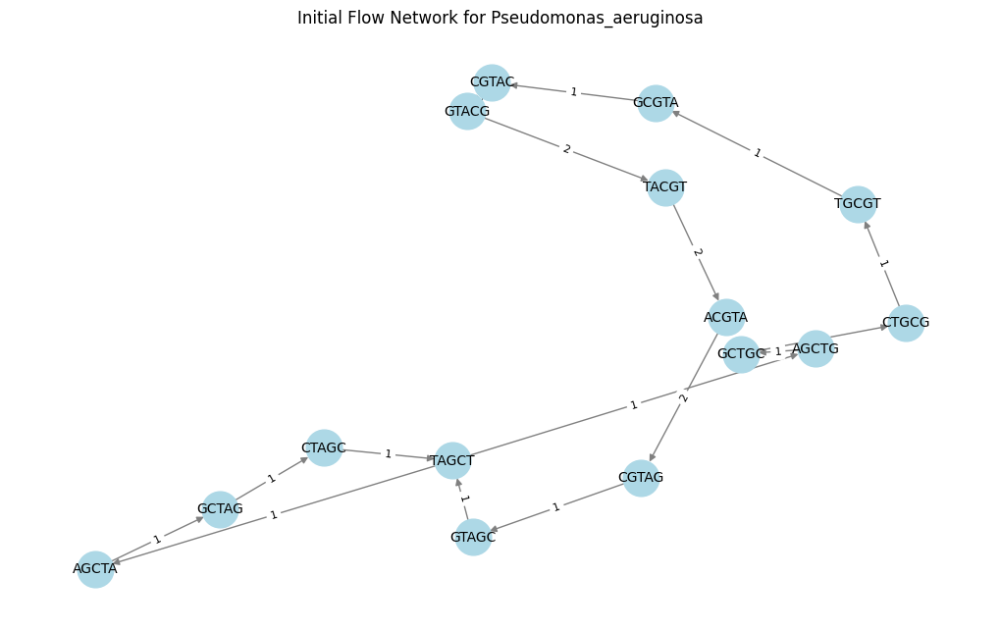


Processing Streptococcus_pneumoniae...


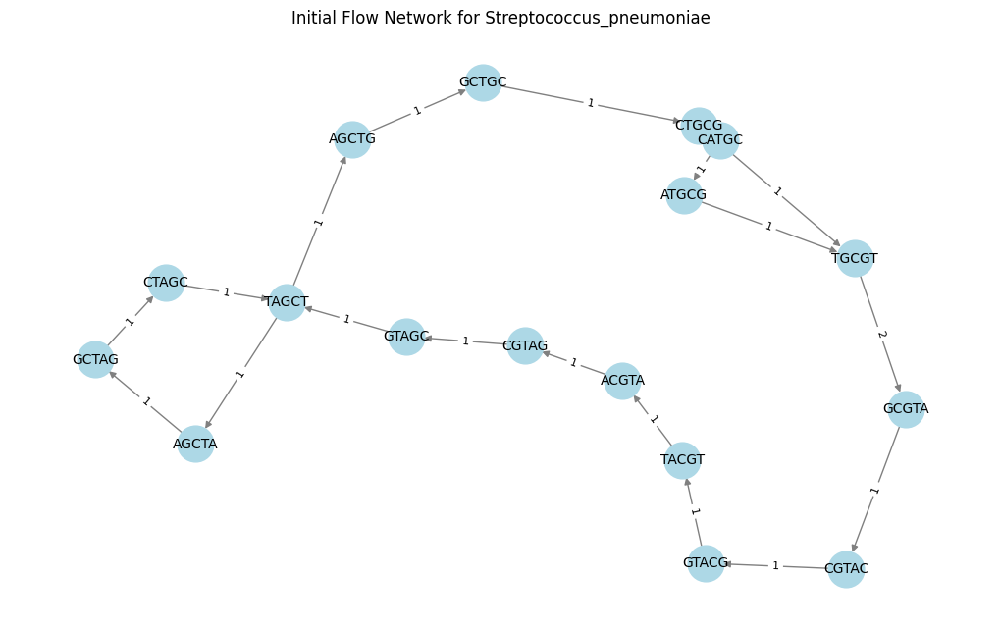

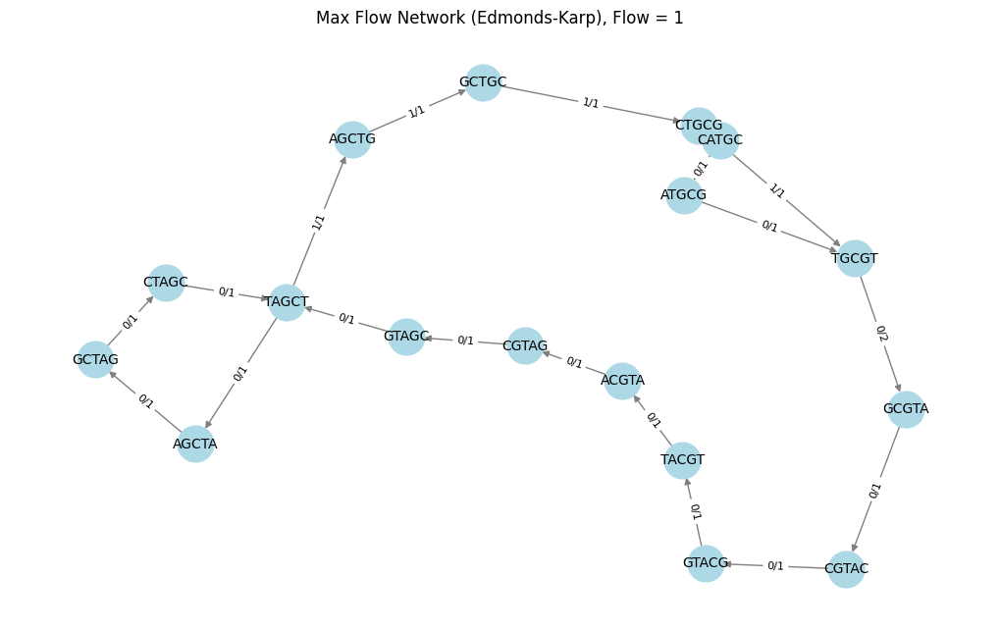


=== Maximum Flow Results ===
Salmonella_enterica: Max Flow = 1
Mycobacterium_tuberculosis: Max Flow = 0
Vibrio_cholerae: Max Flow = 1
Pseudomonas_aeruginosa: Max Flow = 0
Streptococcus_pneumoniae: Max Flow = 1


In [3]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Bacterial genome dataset
bacteria_samples = {
    "Salmonella_enterica": "ATGCGTACGTCGATGCGTACGTA",
    "Mycobacterium_tuberculosis": "CGTACGTAGCTAGCTGCGTACGTA",
    "Vibrio_cholerae": "TGCATGCGTAGCTAGCTGCGTACG",
    "Pseudomonas_aeruginosa": "GTACGTAGCTAGCTGCGTACGTAG",
    "Streptococcus_pneumoniae": "CATGCGTACGTAGCTAGCTGCGTA"
}

# Function to extract k-mers and construct flow network
def build_flow_network(sequence, k=5):
    """Builds a directed graph where nodes are k-mers and edges represent sequence transitions."""
    G = nx.DiGraph()
    for i in range(len(sequence) - k):
        kmer1 = sequence[i:i + k]
        kmer2 = sequence[i + 1:i + k + 1]
        if G.has_edge(kmer1, kmer2):
            G[kmer1][kmer2]['capacity'] += 1  # Increment capacity if edge exists
        else:
            G.add_edge(kmer1, kmer2, capacity=1)  # Initialize edge with capacity 1
    return G

# Function to select source and sink dynamically
def select_source_sink(G):
    """Chooses a source with highest out-degree and sink with highest in-degree."""
    if G.number_of_nodes() < 2:
        return None, None

    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())

    source = max(out_degrees, key=out_degrees.get, default=None)
    sink = max(in_degrees, key=in_degrees.get, default=None)

    return source, sink

# Function to visualize a network
def visualize_network(G, title="Flow Network", flow_dict=None):
    """Visualizes the graph with capacities or flows."""
    pos = nx.spring_layout(G, seed=42)
    plt.figure(figsize=(10, 6))

    # Draw nodes and edges
    nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=700, font_size=10)

    # Label edges with capacities or flows
    if flow_dict:
        labels = { (u, v): f"{flow_dict[u][v]}/{G[u][v]['capacity']}" for u, v in G.edges() }
    else:
        labels = { (u, v): f"{G[u][v]['capacity']}" for u, v in G.edges() }

    nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=8)
    plt.title(title)
    plt.show()

# Function to compute max flow using Edmonds-Karp
def compute_max_flow(G):
    """Computes max flow using Edmonds-Karp and visualizes results."""
    source, sink = select_source_sink(G)
    if not source or not sink or source == sink:
        return 0

    # Compute max flow
    max_flow_value, flow_dict = nx.maximum_flow(G, source, sink, flow_func=nx.algorithms.flow.edmonds_karp)

    # Visualize flow network after computation
    visualize_network(G, title=f"Max Flow Network (Edmonds-Karp), Flow = {max_flow_value}", flow_dict=flow_dict)

    return max_flow_value

# Process each bacterial sequence and compute max flow
max_flow_results = []
for bacteria, sequence in bacteria_samples.items():
    print(f"\nProcessing {bacteria}...")
    flow_graph = build_flow_network(sequence)
    visualize_network(flow_graph, title=f"Initial Flow Network for {bacteria}")  # Show initial network
    max_flow = compute_max_flow(flow_graph)
    max_flow_results.append((bacteria, max_flow))

# Print final max flow results
print("\n=== Maximum Flow Results ===")
for bacteria, max_flow in max_flow_results:
    print(f"{bacteria}: Max Flow = {max_flow}")



Processing Salmonella_enterica...


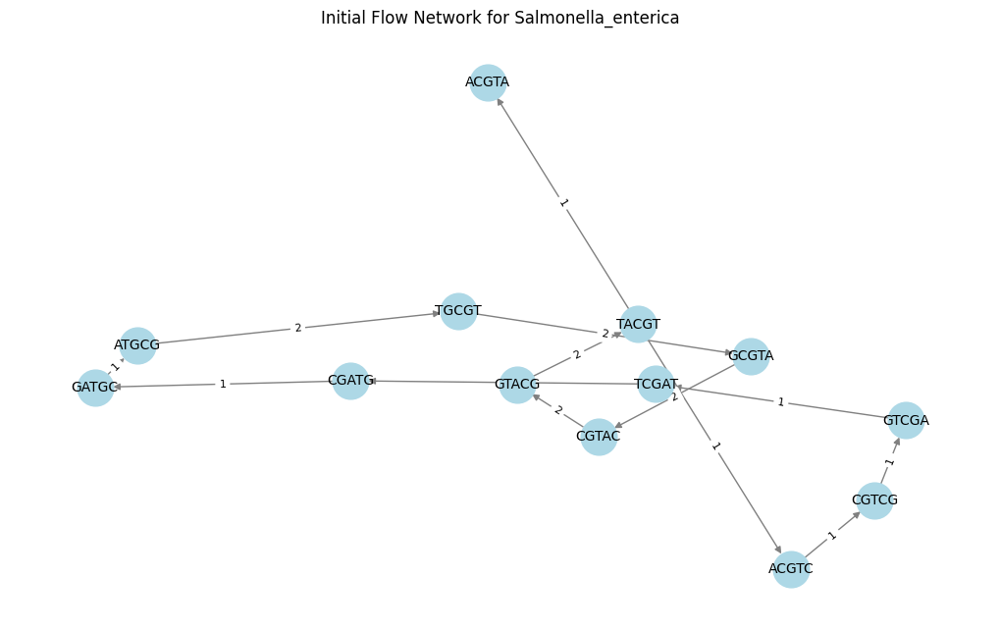

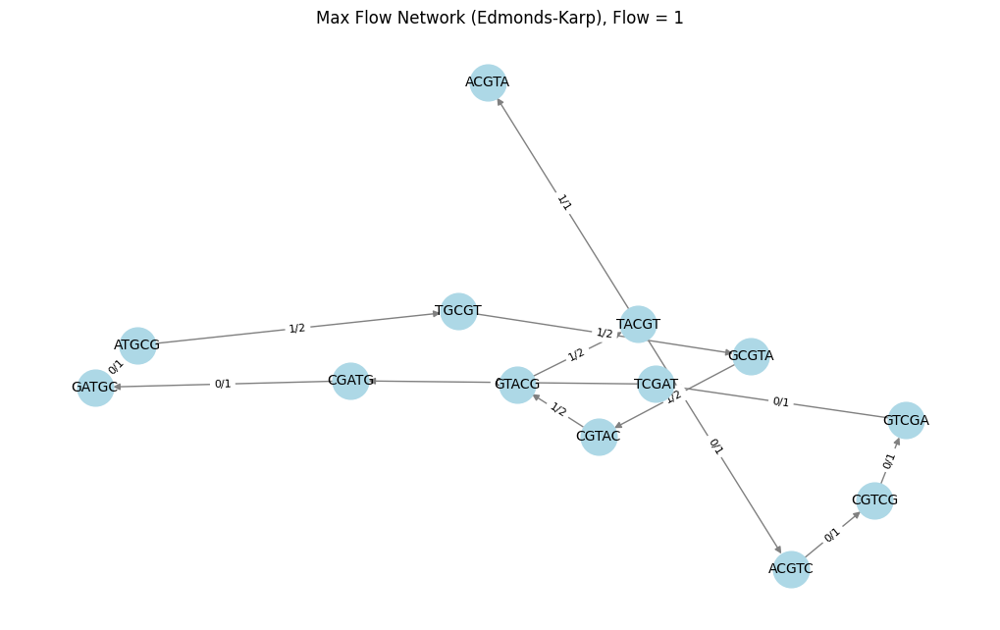


Processing Mycobacterium_tuberculosis...


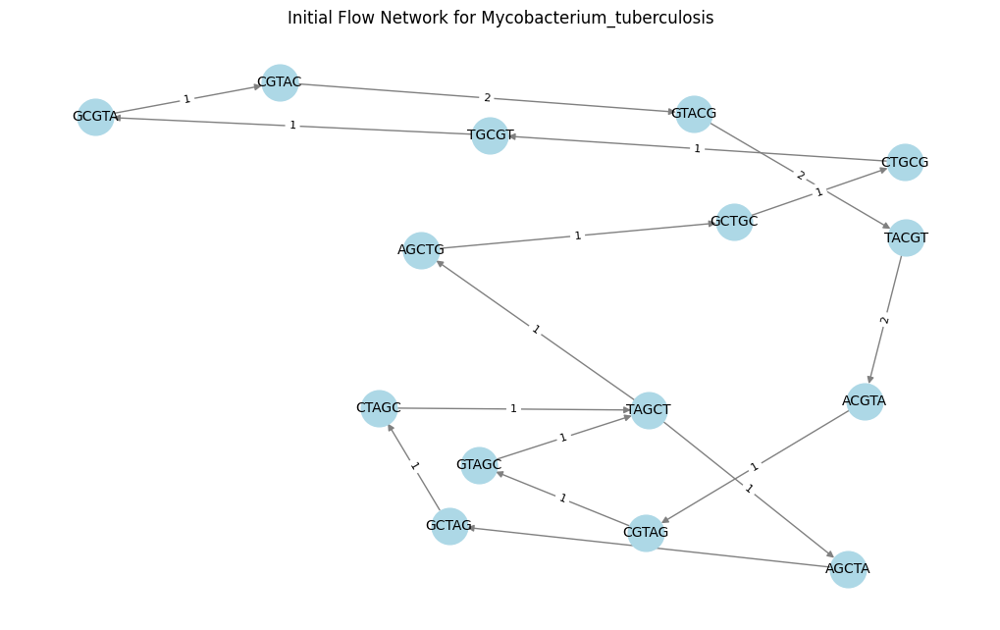

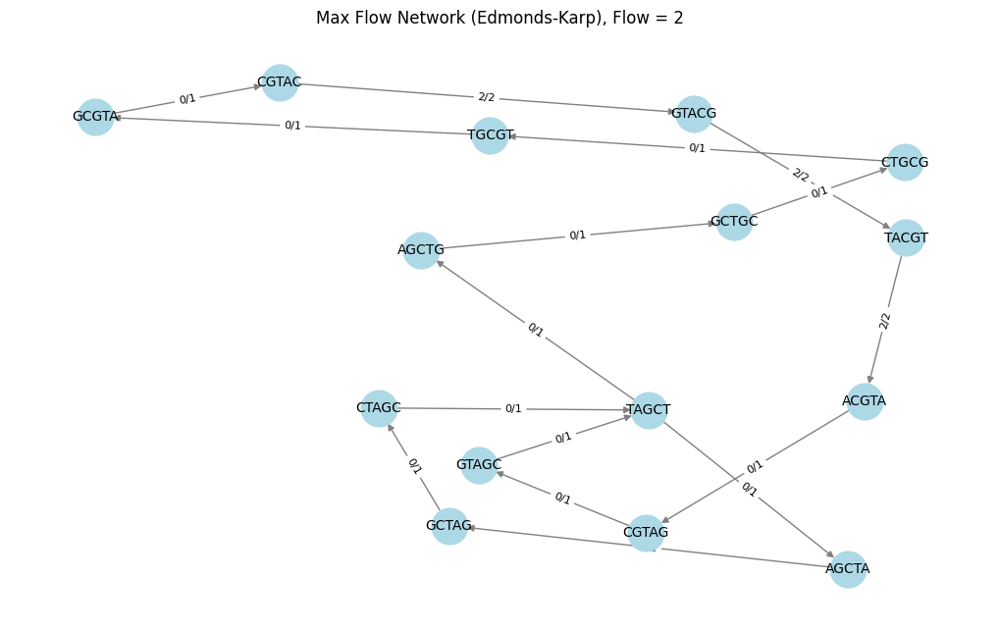


Processing Vibrio_cholerae...


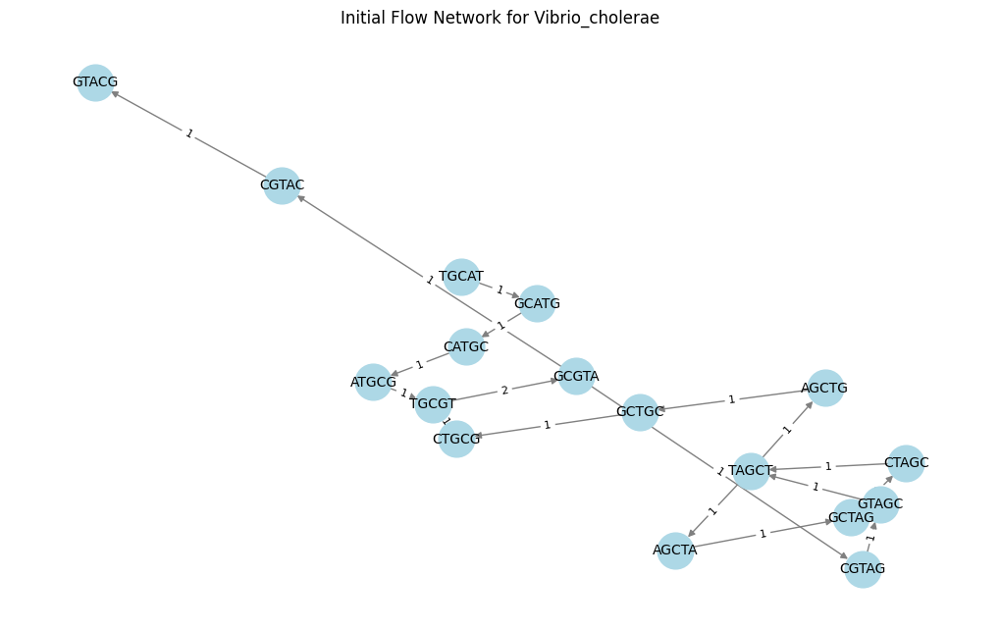

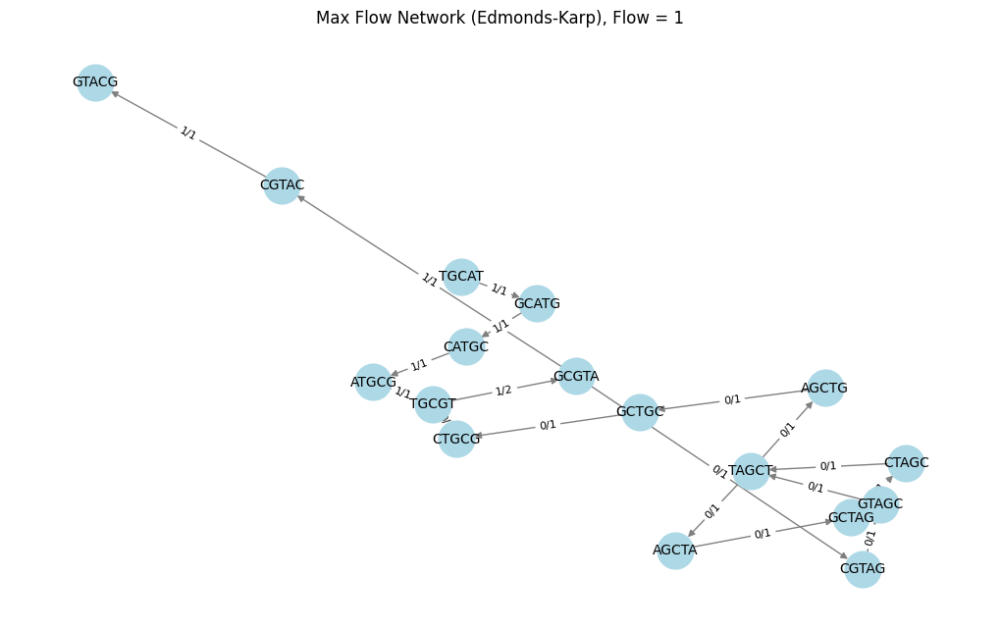


Processing Pseudomonas_aeruginosa...


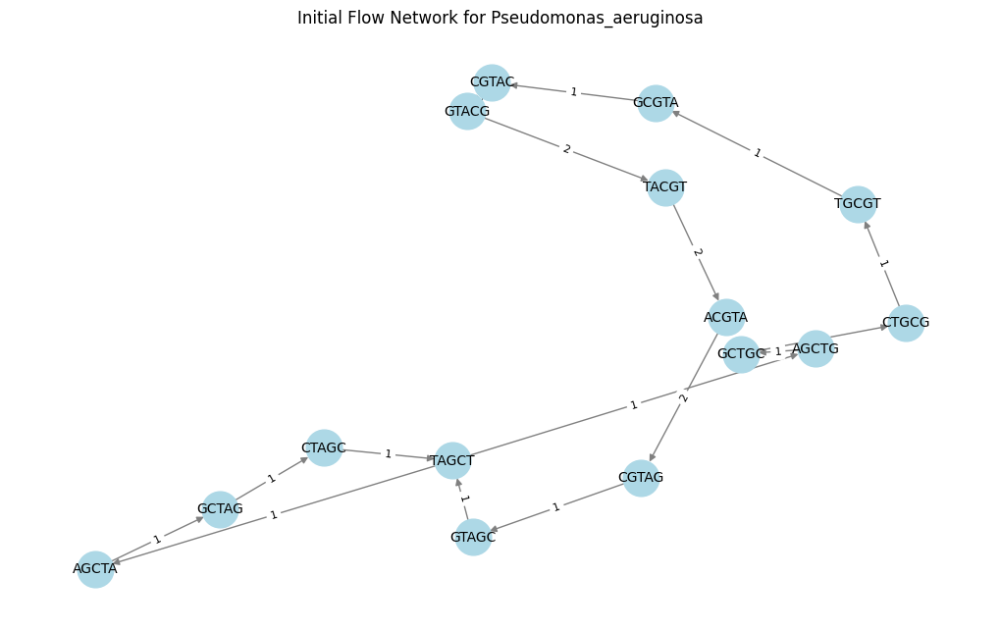

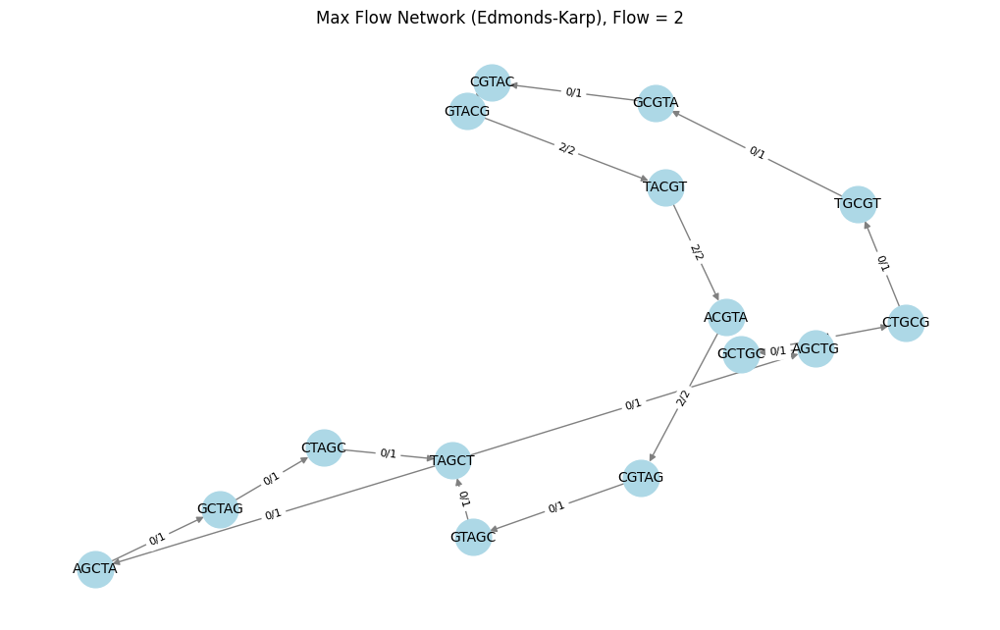


Processing Streptococcus_pneumoniae...


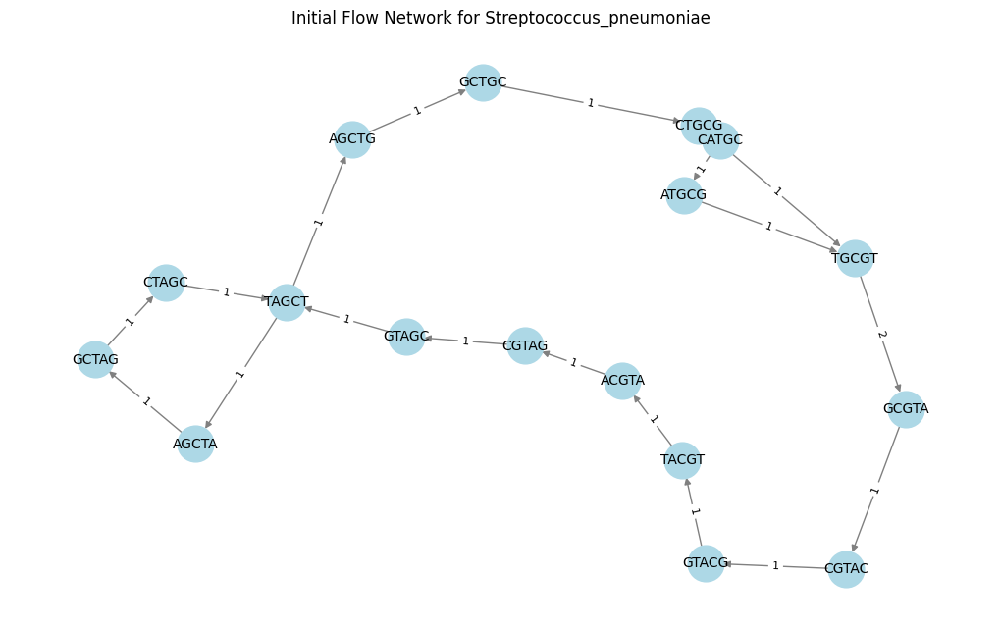

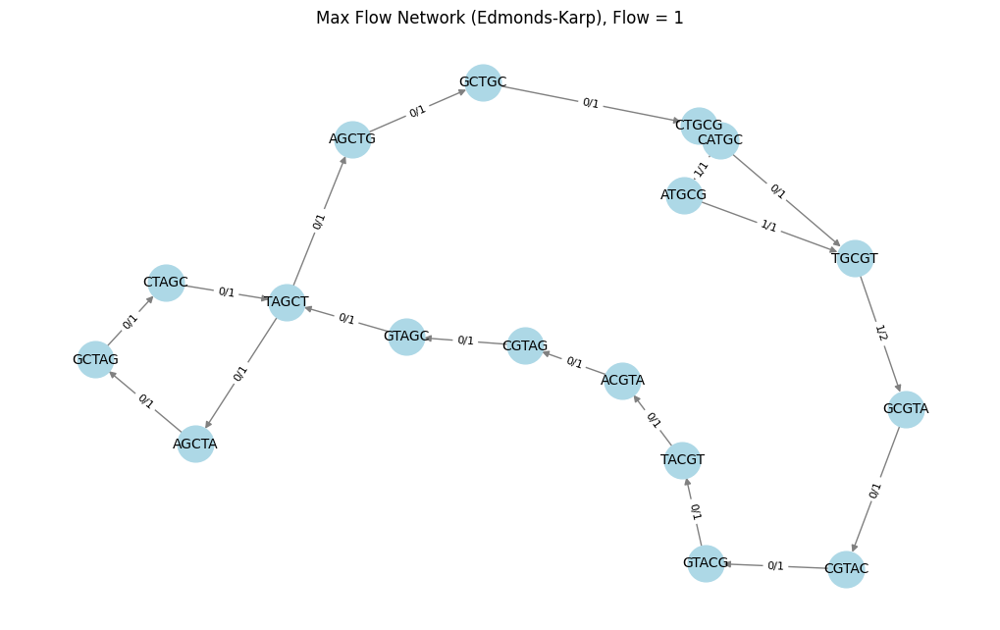


=== Maximum Flow Results ===
Salmonella_enterica: Max Flow = 1
Mycobacterium_tuberculosis: Max Flow = 2
Vibrio_cholerae: Max Flow = 1
Pseudomonas_aeruginosa: Max Flow = 2
Streptococcus_pneumoniae: Max Flow = 1


In [4]:
import networkx as nx
import matplotlib.pyplot as plt

# Bacterial genome dataset
bacteria_samples = {
    "Salmonella_enterica": "ATGCGTACGTCGATGCGTACGTA",
    "Mycobacterium_tuberculosis": "CGTACGTAGCTAGCTGCGTACGTA",
    "Vibrio_cholerae": "TGCATGCGTAGCTAGCTGCGTACG",
    "Pseudomonas_aeruginosa": "GTACGTAGCTAGCTGCGTACGTAG",
    "Streptococcus_pneumoniae": "CATGCGTACGTAGCTAGCTGCGTA"
}

# Function to extract k-mers and construct flow network
def build_flow_network(sequence, k=5):
    """Builds a directed graph where nodes are k-mers and edges represent sequence transitions."""
    G = nx.DiGraph()
    kmer_list = []

    for i in range(len(sequence) - k):
        kmer1 = sequence[i:i + k]
        kmer2 = sequence[i + 1:i + k + 1]

        kmer_list.append(kmer1)

        if G.has_edge(kmer1, kmer2):
            G[kmer1][kmer2]['capacity'] += 1  # Increment capacity if edge exists
        else:
            G.add_edge(kmer1, kmer2, capacity=1)  # Initialize edge with capacity 1

    # Ensure last k-mer is in the graph
    kmer_list.append(sequence[-k:])

    return G, kmer_list[0], kmer_list[-1]  # Return graph, source (first k-mer), and sink (last k-mer)

# Function to visualize a network
def visualize_network(G, title="Flow Network", flow_dict=None):
    """Visualizes the graph with capacities or flows."""
    pos = nx.spring_layout(G, seed=42)
    plt.figure(figsize=(10, 6))

    # Draw nodes and edges
    nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=700, font_size=10)

    # Label edges with capacities or flows
    if flow_dict:
        labels = { (u, v): f"{flow_dict[u][v]}/{G[u][v]['capacity']}" for u, v in G.edges() }
    else:
        labels = { (u, v): f"{G[u][v]['capacity']}" for u, v in G.edges() }

    nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=8)
    plt.title(title)
    plt.show()

# Function to compute max flow using Edmonds-Karp
def compute_max_flow(G, source, sink):
    """Computes max flow using Edmonds-Karp and visualizes results."""
    if not source or not sink or source == sink:
        return 0

    # Compute max flow
    max_flow_value, flow_dict = nx.maximum_flow(G, source, sink, flow_func=nx.algorithms.flow.edmonds_karp)

    # Visualize flow network after computation
    visualize_network(G, title=f"Max Flow Network (Edmonds-Karp), Flow = {max_flow_value}", flow_dict=flow_dict)

    return max_flow_value

# Process each bacterial sequence and compute max flow
max_flow_results = []
for bacteria, sequence in bacteria_samples.items():
    print(f"\nProcessing {bacteria}...")

    # Build the graph and get source & sink correctly
    flow_graph, source, sink = build_flow_network(sequence)

    # Show the initial network
    visualize_network(flow_graph, title=f"Initial Flow Network for {bacteria}")

    # Compute max flow using Edmonds-Karp
    max_flow = compute_max_flow(flow_graph, source, sink)

    max_flow_results.append((bacteria, max_flow))

# Print final max flow results
print("\n=== Maximum Flow Results ===")
for bacteria, max_flow in max_flow_results:
    print(f"{bacteria}: Max Flow = {max_flow}")



Fetching genome for Salmonella_enterica (Accession: NC_003197.2)...


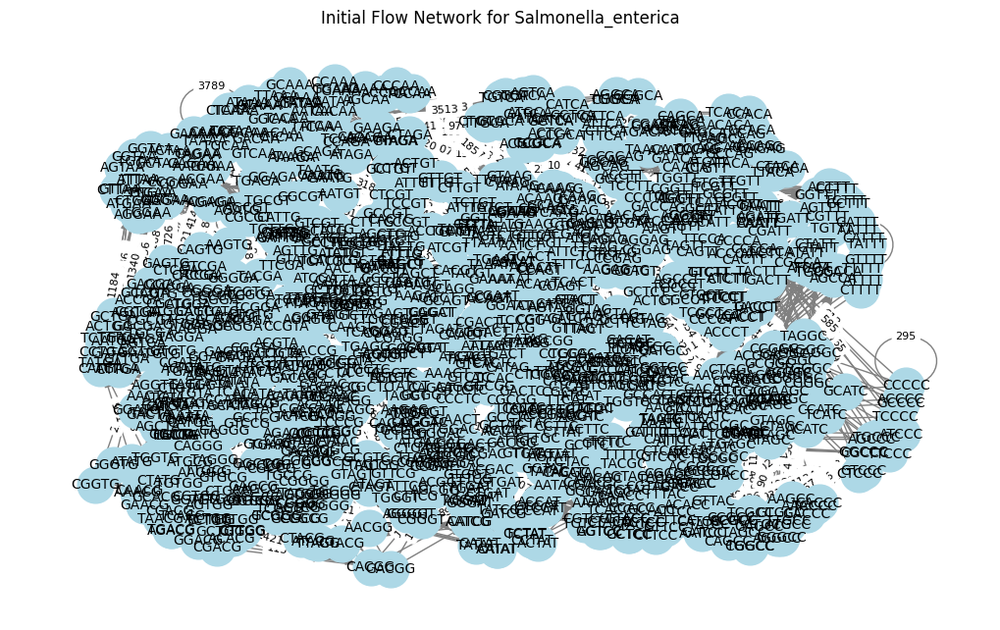

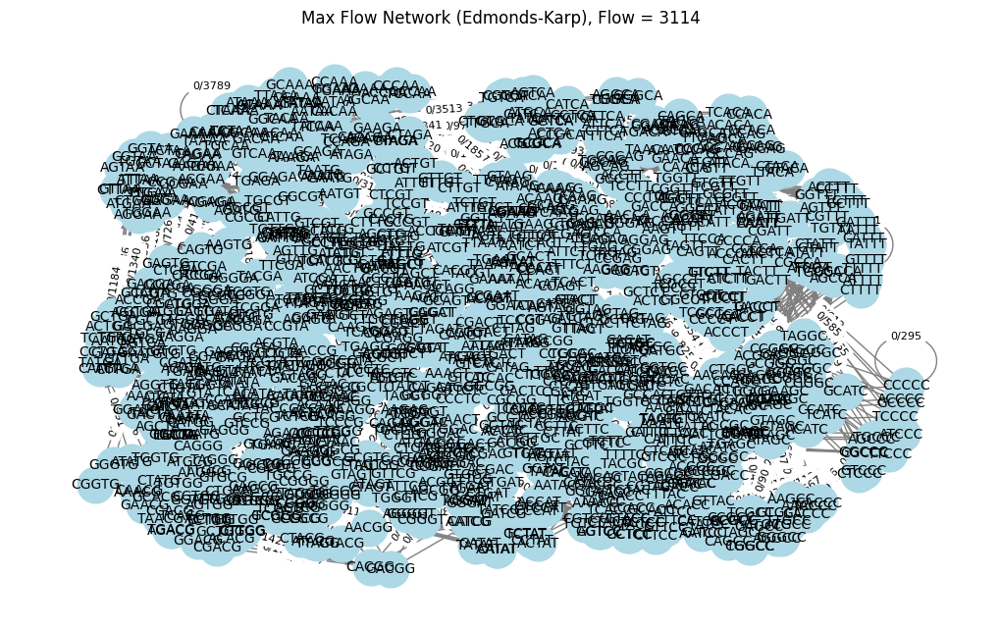


Fetching genome for Mycobacterium_tuberculosis (Accession: NC_000962.3)...


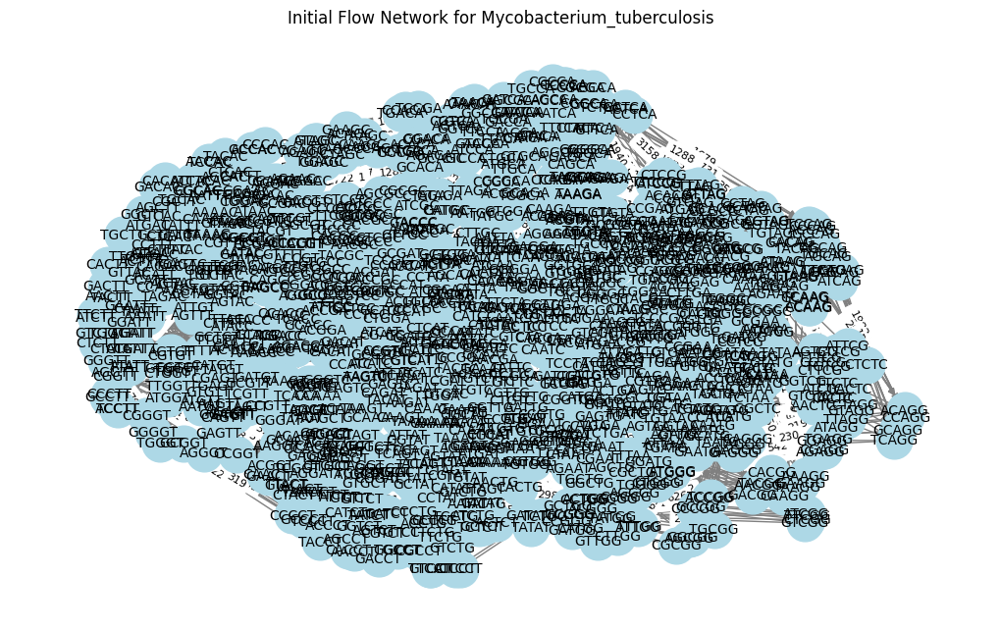

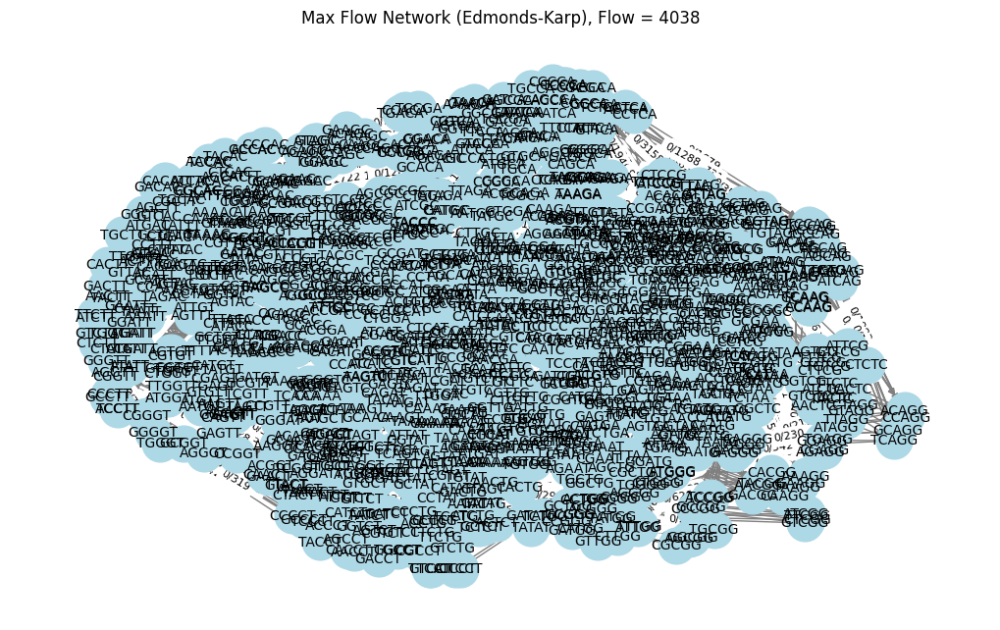


Fetching genome for Vibrio_cholerae (Accession: NC_002505.1)...


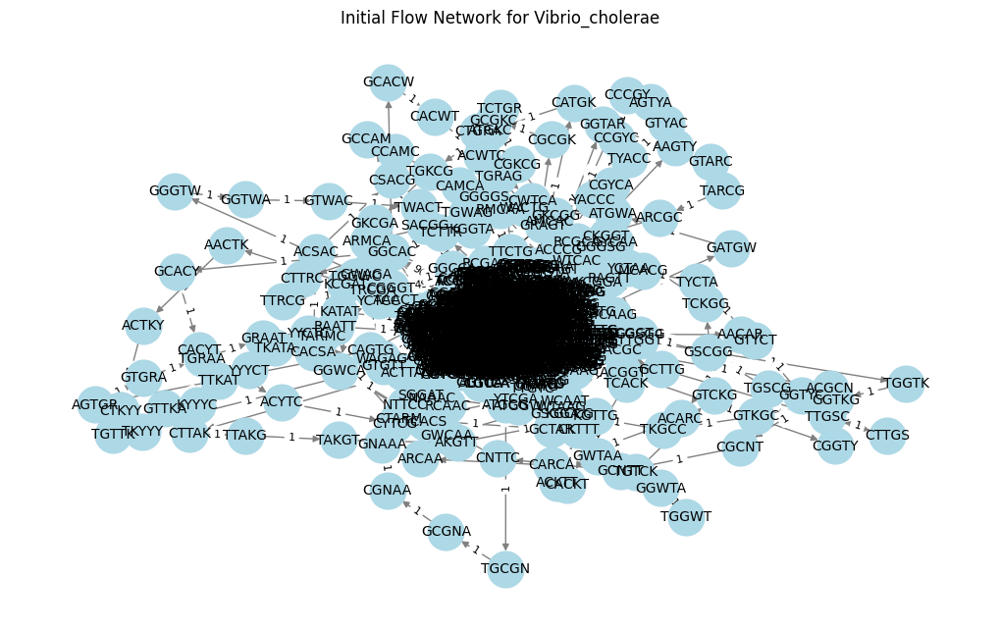

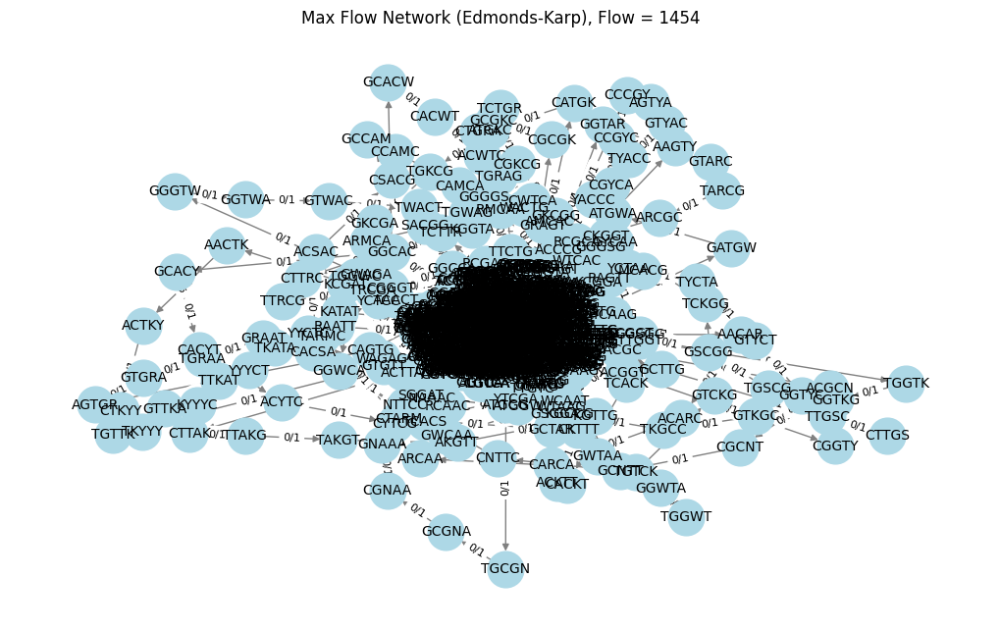


Fetching genome for Pseudomonas_aeruginosa (Accession: NC_002516.2)...


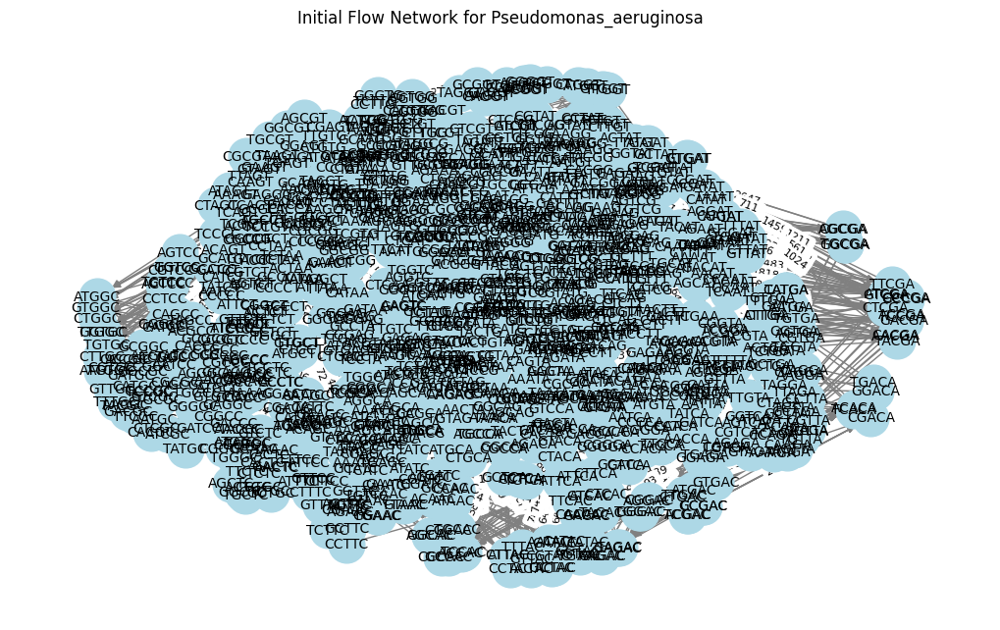

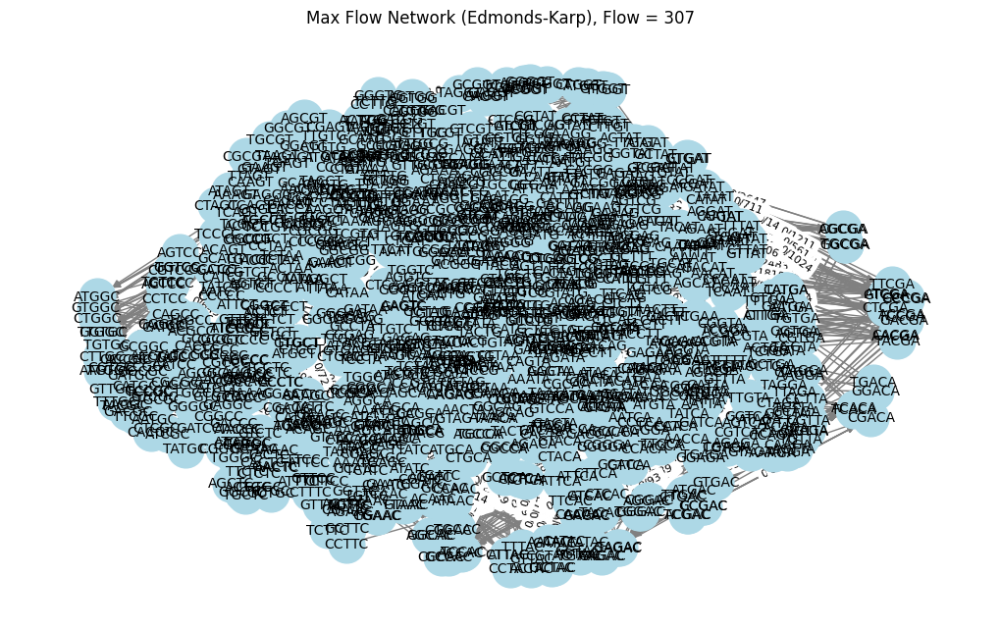


Fetching genome for Streptococcus_pneumoniae (Accession: NC_003098.1)...


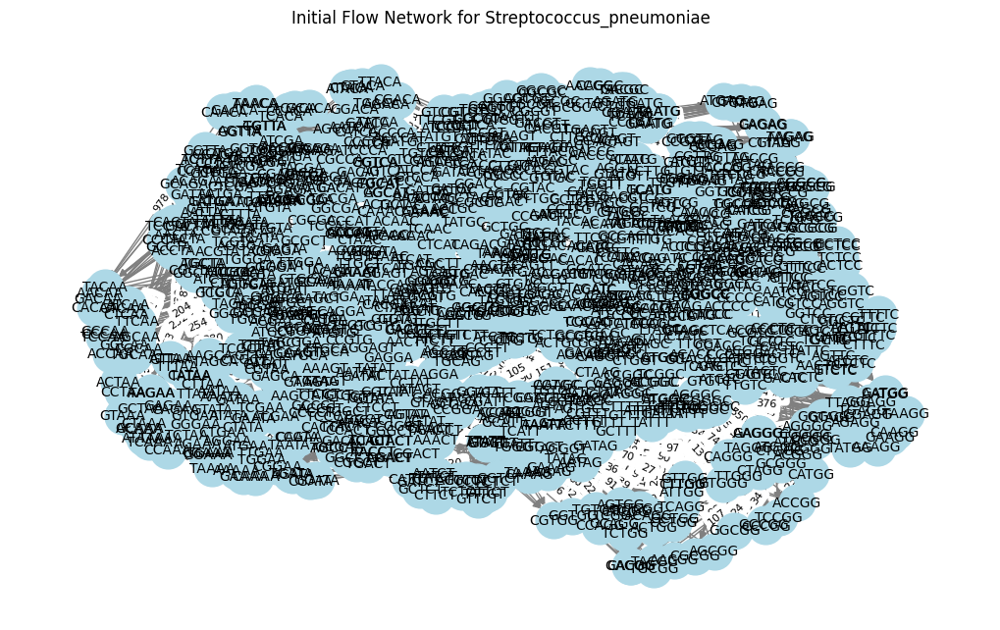

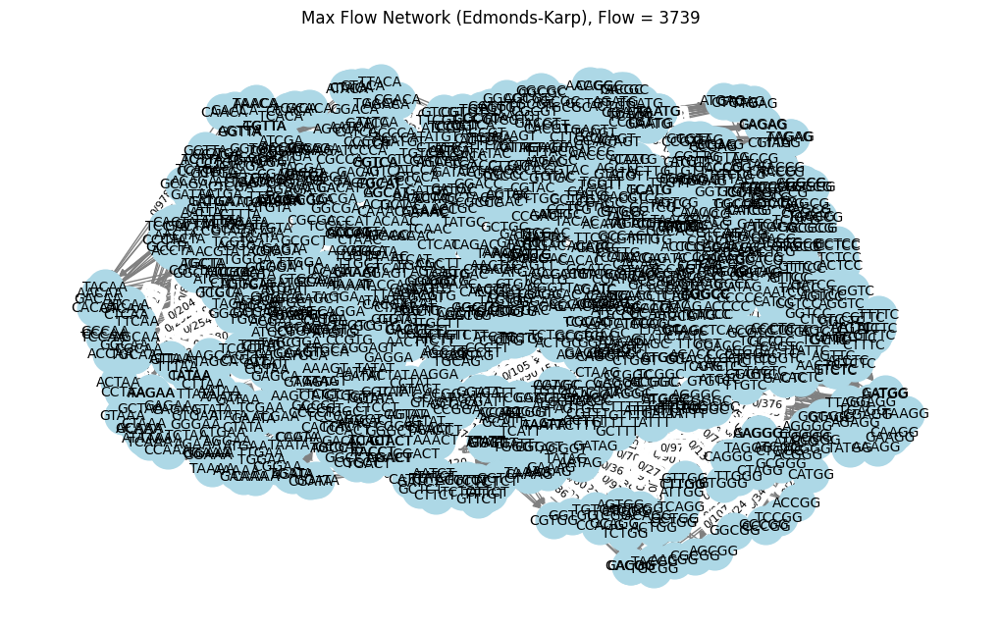


=== Maximum Flow Results ===
Salmonella_enterica: Max Flow = 3114
Mycobacterium_tuberculosis: Max Flow = 4038
Vibrio_cholerae: Max Flow = 1454
Pseudomonas_aeruginosa: Max Flow = 307
Streptococcus_pneumoniae: Max Flow = 3739


In [5]:
import networkx as nx
import matplotlib.pyplot as plt
from Bio import Entrez, SeqIO

# Set your email for NCBI access (required)
Entrez.email = "your_email@example.com"

# Bacterial dataset with their respective genome accession numbers
bacteria_samples = {
    "Salmonella_enterica": "NC_003197.2",
    "Mycobacterium_tuberculosis": "NC_000962.3",
    "Vibrio_cholerae": "NC_002505.1",
    "Pseudomonas_aeruginosa": "NC_002516.2",
    "Streptococcus_pneumoniae": "NC_003098.1"
}

# Function to fetch genome sequence from NCBI
def fetch_genome_sequence(accession):
    """Fetches genome sequence from NCBI using accession number."""
    try:
        handle = Entrez.efetch(db="nucleotide", id=accession, rettype="fasta", retmode="text")
        record = SeqIO.read(handle, "fasta")
        handle.close()
        return str(record.seq)  # Return the genome sequence as a string
    except Exception as e:
        print(f"Error fetching {accession}: {e}")
        return None

# Function to extract k-mers and construct flow network
def build_flow_network(sequence, k=5):
    """Builds a directed graph where nodes are k-mers and edges represent sequence transitions."""
    G = nx.DiGraph()
    kmer_list = []

    for i in range(len(sequence) - k):
        kmer1 = sequence[i:i + k]
        kmer2 = sequence[i + 1:i + k + 1]

        kmer_list.append(kmer1)

        if G.has_edge(kmer1, kmer2):
            G[kmer1][kmer2]['capacity'] += 1  # Increment capacity if edge exists
        else:
            G.add_edge(kmer1, kmer2, capacity=1)  # Initialize edge with capacity 1

    # Ensure last k-mer is in the graph
    kmer_list.append(sequence[-k:])

    return G, kmer_list[0], kmer_list[-1]  # Return graph, source (first k-mer), and sink (last k-mer)

# Function to visualize a network
def visualize_network(G, title="Flow Network", flow_dict=None):
    """Visualizes the graph with capacities or flows."""
    pos = nx.spring_layout(G, seed=42)
    plt.figure(figsize=(10, 6))

    # Draw nodes and edges
    nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=700, font_size=10)

    # Label edges with capacities or flows
    if flow_dict:
        labels = { (u, v): f"{flow_dict[u][v]}/{G[u][v]['capacity']}" for u, v in G.edges() }
    else:
        labels = { (u, v): f"{G[u][v]['capacity']}" for u, v in G.edges() }

    nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=8)
    plt.title(title)
    plt.show()

# Function to compute max flow using Edmonds-Karp
def compute_max_flow(G, source, sink):
    """Computes max flow using Edmonds-Karp and visualizes results."""
    if not source or not sink or source == sink:
        return 0

    # Compute max flow
    max_flow_value, flow_dict = nx.maximum_flow(G, source, sink, flow_func=nx.algorithms.flow.edmonds_karp)

    # Visualize flow network after computation
    visualize_network(G, title=f"Max Flow Network (Edmonds-Karp), Flow = {max_flow_value}", flow_dict=flow_dict)

    return max_flow_value

# Process each bacterial genome
max_flow_results = []
for bacteria, accession in bacteria_samples.items():
    print(f"\nFetching genome for {bacteria} (Accession: {accession})...")

    # Retrieve genome sequence using accession number
    sequence = fetch_genome_sequence(accession)
    if not sequence:
        print(f"Skipping {bacteria} due to missing sequence.")
        continue  # Skip to next bacterium

    # Build the graph and get source & sink correctly
    flow_graph, source, sink = build_flow_network(sequence)

    # Show the initial network
    visualize_network(flow_graph, title=f"Initial Flow Network for {bacteria}")

    # Compute max flow using Edmonds-Karp
    max_flow = compute_max_flow(flow_graph, source, sink)

    max_flow_results.append((bacteria, max_flow))

# Print final max flow results
print("\n=== Maximum Flow Results ===")
for bacteria, max_flow in max_flow_results:
    print(f"{bacteria}: Max Flow = {max_flow}")
